# Basic description (summaries, histograms, boxplots, spread measures, density).

Basically i repeated the plots present in the **2-raw_data_analysis-v2.ipynb**

## 1. Load Data

In [6]:
import pandas as pd 
import numpy as np 
import seaborn as sns
import missingno as msno
sns.set_theme(style='darkgrid')
import matplotlib.pyplot as plt

In [7]:
data = pd.read_csv('Assignment/DataSets/preprocessed_data.csv')

In [8]:
data.columns

Index(['Peso', 'Altura', 'IMC', 'Idade', 'Pulsos', 'SBP', 'DBP',
       'Result SBP-DBP', 'B2', 'Sopro', 'FC', 'HDA1', 'HDA2', 'Sexo',
       'Motivo1', 'Motivo2', 'Intervalo Idade', 'Percentil IMC',
       'Systolic Blood Pressure (SBP)', 'Diastolic Blood Pressure (DBP)',
       'Patologia'],
      dtype='object')

In [9]:
data.head()

,Peso,Altura,IMC,Idade,Pulsos,SBP,DBP,Result SBP-DBP,B2,Sopro,...,HDA1,HDA2,Sexo,Motivo1,Motivo2,Intervalo Idade,Percentil IMC,Systolic Blood Pressure (SBP),Diastolic Blood Pressure (DBP),Patologia
0,39.5,142,19.59,9,Normal,85.0,50.0,Normal,Normal,Ausente,...,Assintomático,Assintomático,Masculino,Triagem Cardiológica,Atividade física,School,Overweigth,Normal,Normal,Anormal
1,26.0,112,20.73,4,Normal,100.0,60.0,Normal,Fixed Split,Ausente,...,Assintomático,Assintomático,Masculino,Checkup de rotina,Outros,Pre-School,Obese,Normal,Normal,Anormal
2,28.0,117,20.45,5,Normal,110.0,65.0,Pre-hipertenso,Normal,Ausente,...,Assintomático,Assintomático,Feminino,Triagem Cardiológica,Cirurgia,Pre-School,Obese,Normal,Normal,Anormal
3,24.5,122,16.46,6,Normal,100.0,65.0,Normal,Normal,Sistólico,...,Assintomático,Assintomático,Masculino,Triagem Cardiológica,Cirurgia,School,Normal,Normal,Normal,Anormal
4,10.5,89,13.26,2,Normal,90.0,60.0,Pre-hipertenso,Normal,Ausente,...,Assintomático,Assintomático,Feminino,Triagem Cardiológica,Cirurgia,Pre-School,Low Weigth,Pre-Hipertenso,Pre-Hipertenso,Normal


## 1.2 Summaries

In [10]:
data.shape

(6293, 21)

In [12]:
data.info(verbose=True)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6293 entries, 0 to 6292
Data columns (total 21 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Peso                            6293 non-null   float64
 1   Altura                          6293 non-null   int64  
 2   IMC                             6293 non-null   float64
 3   Idade                           6293 non-null   int64  
 4   Pulsos                          6293 non-null   object 
 5   SBP                             6293 non-null   float64
 6   DBP                             6293 non-null   float64
 7   Result SBP-DBP                  6293 non-null   object 
 8   B2                              6293 non-null   object 
 9   Sopro                           6293 non-null   object 
 10  FC                              6293 non-null   float64
 11  HDA1                            6293 non-null   object 
 12  HDA2                            62

In [13]:
print('Overview of Columns:')
data.describe().transpose()

Overview of Columns:


,count,mean,std,min,25%,50%,75%,max
Peso,6293.0,32.680057,15.257369,9.30,21.00,29.0,42.0,126.0
Altura,6293.0,129.690291,21.165047,67.00,112.00,129.0,145.0,198.0
IMC,6293.0,18.398419,3.806749,10.58,15.68,17.5,20.3,43.6
Idade,6293.0,8.209280,3.690234,2.00,5.00,8.0,11.0,18.0
SBP,6293.0,100.977117,9.823221,80.00,90.00,100.0,108.0,150.0
DBP,6293.0,62.120610,8.069188,40.00,60.00,60.0,70.0,100.0
FC,6293.0,85.480852,10.229199,55.00,80.00,84.0,92.0,124.0


In [14]:
# Calculating missing value percentage in the dataset
missing = data.isna().sum()
mis_per = (missing / len(data)) * 100
mis_table = pd.concat([missing, mis_per.round(2)], axis = 1)
mis_table = mis_table.rename(columns = {0 : 'Missing Values', 1 : 'Percentage of Total Values'})

print(mis_table.loc[mis_per > 0])

Empty DataFrame
Columns: [Missing Values, Percentage of Total Values]
Index: []


In [15]:
data.value_counts("Patologia")

Patologia
Normal     4103
Anormal    2190
Name: count, dtype: int64

## 1.3 Visualization

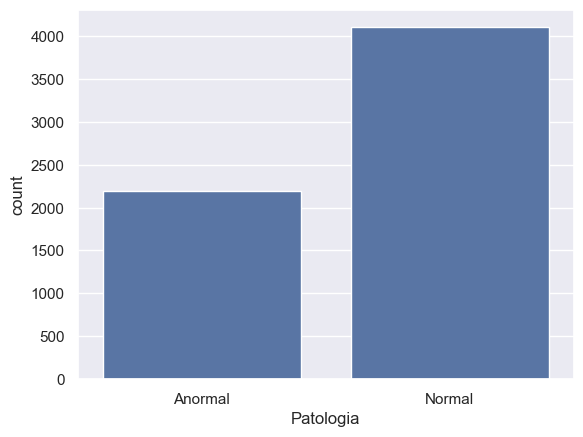

In [16]:
sns.countplot(x='Patologia', data=data, )
plt.show()

#### 1.3.1 Realtion between features with pair plot 

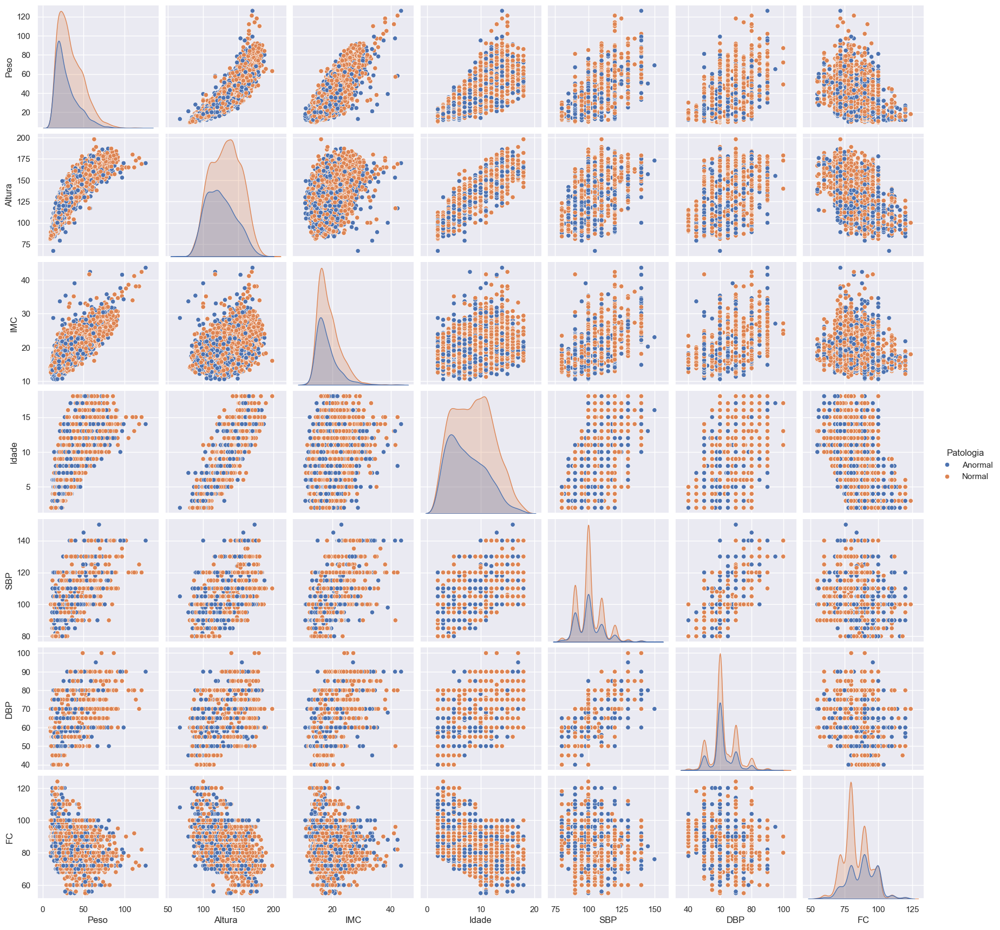

In [19]:
sns.pairplot(data,hue='Patologia')

### 1.3.2 Histogramas

In [24]:
data.select_dtypes(exclude='number').columns

Index(['Pulsos', 'Result SBP-DBP', 'B2', 'Sopro', 'HDA1', 'HDA2', 'Sexo',
       'Motivo1', 'Motivo2', 'Intervalo Idade', 'Percentil IMC',
       'Systolic Blood Pressure (SBP)', 'Diastolic Blood Pressure (DBP)',
       'Patologia'],
      dtype='object')

--- Generating Histograms for Numerical Features ---


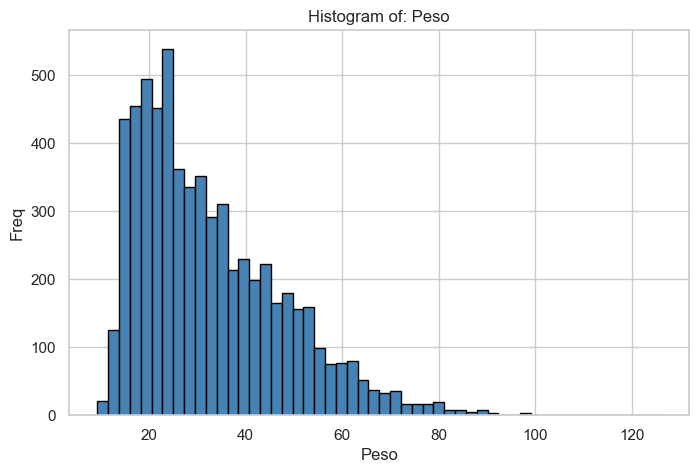

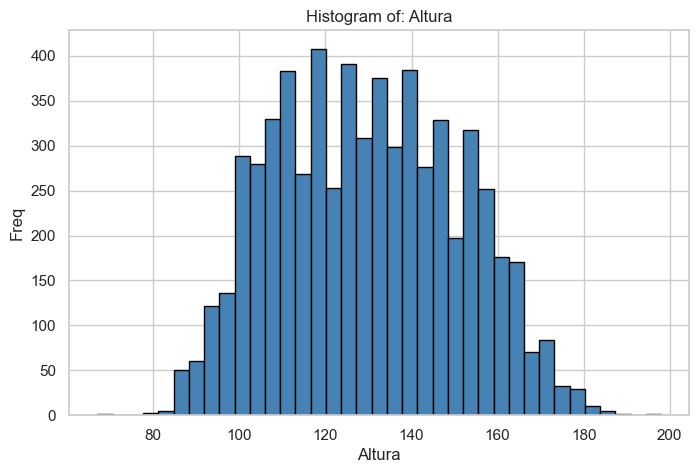

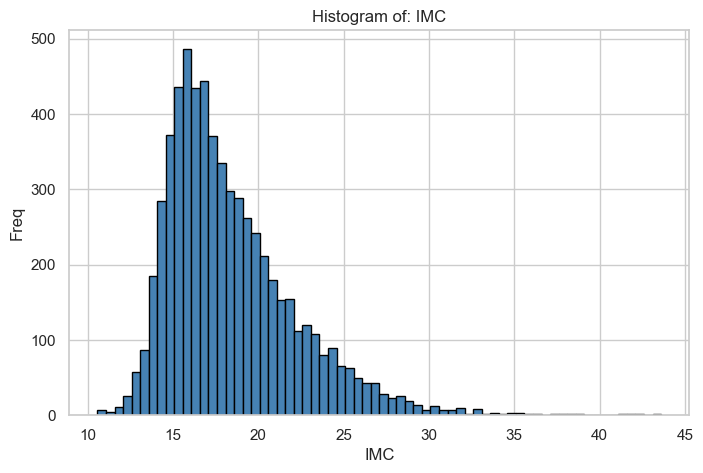

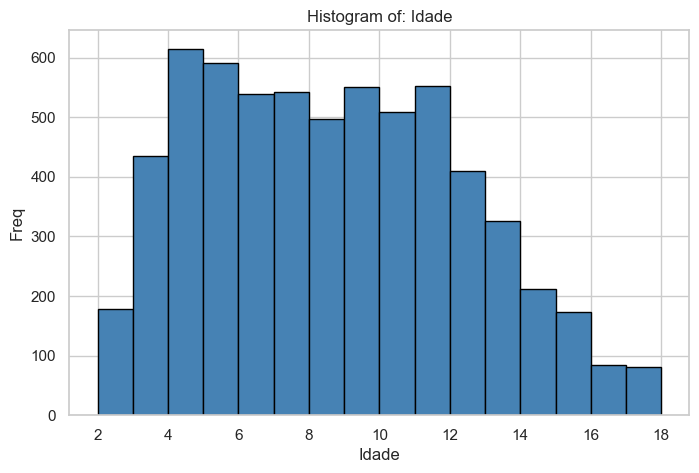

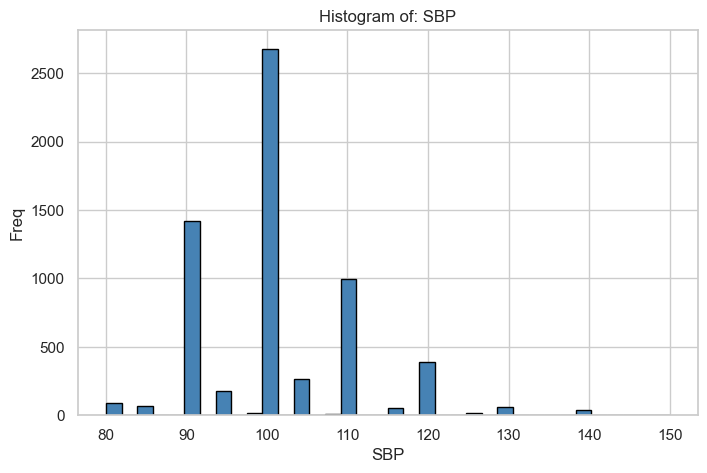

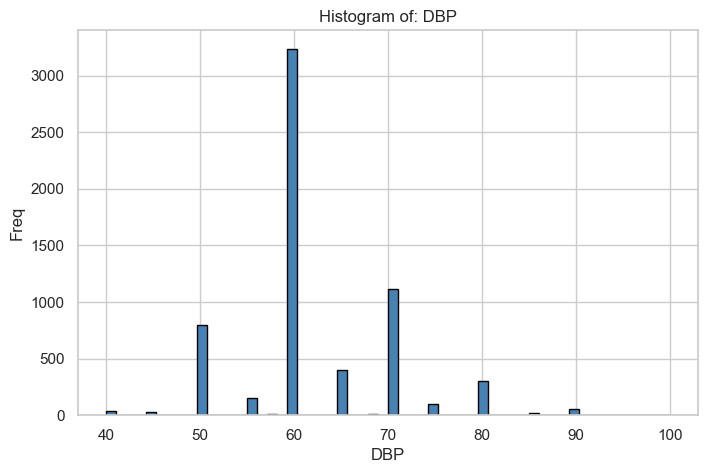

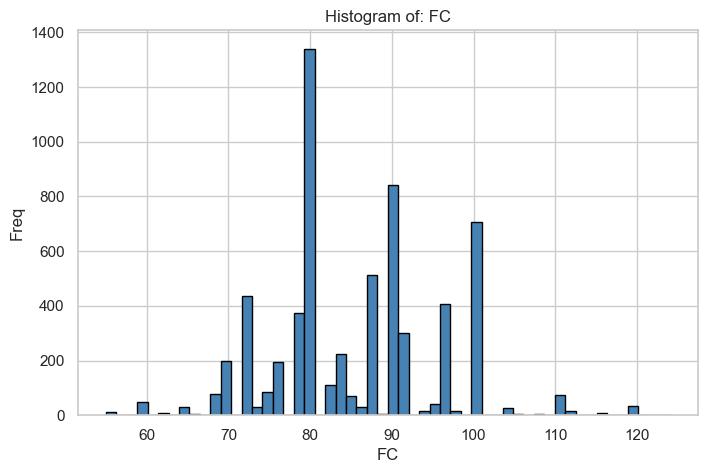


--- Generating Countplot for Categorical Features---


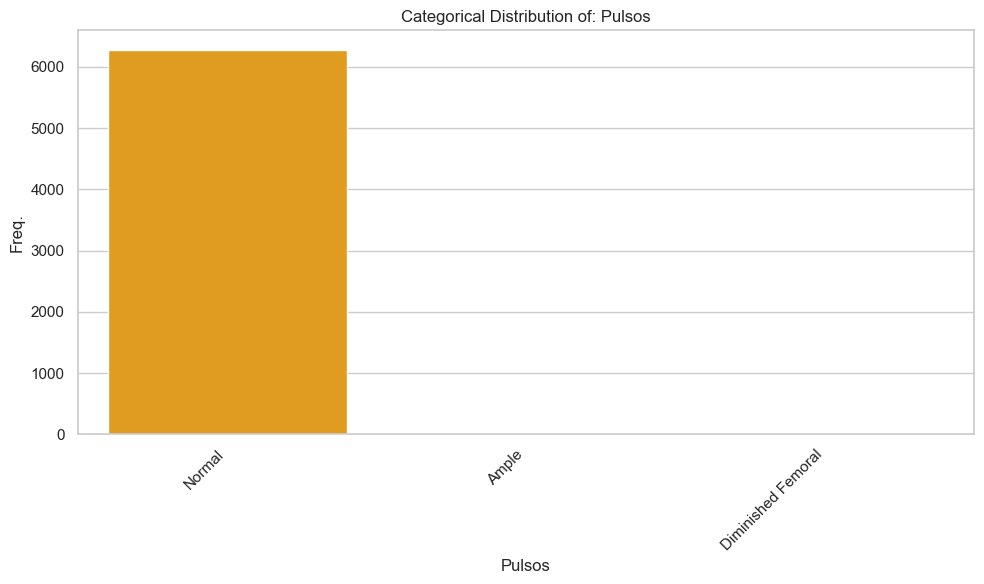

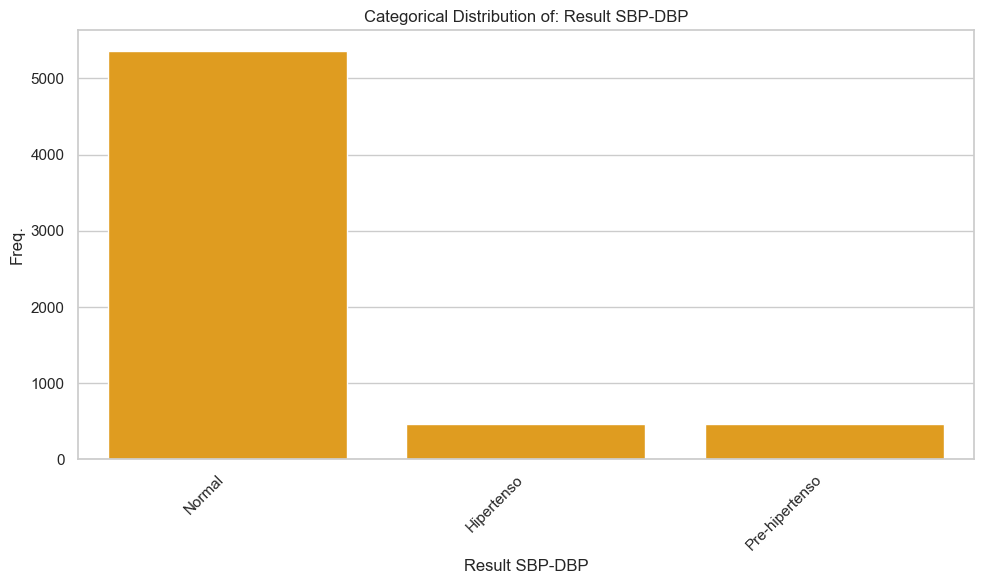

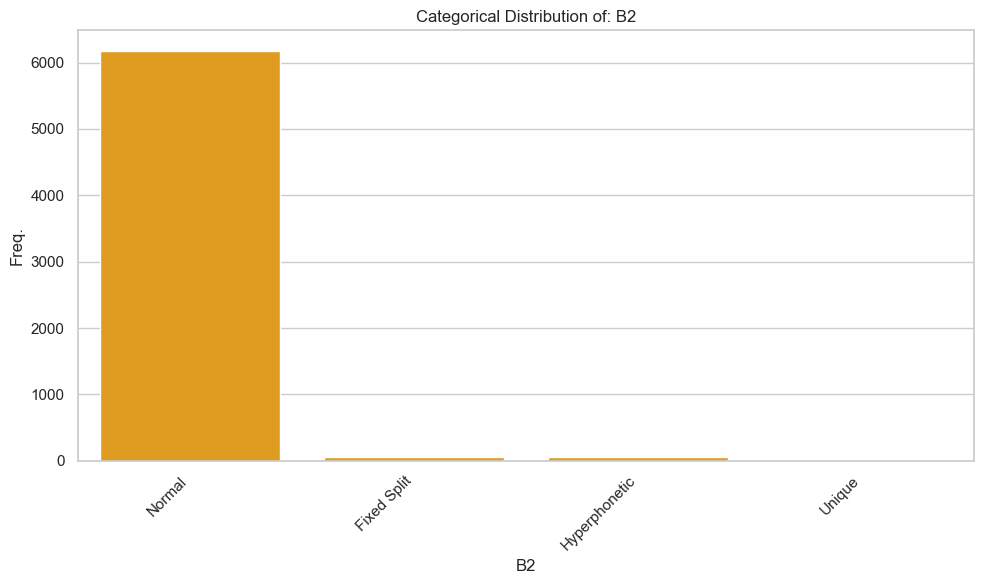

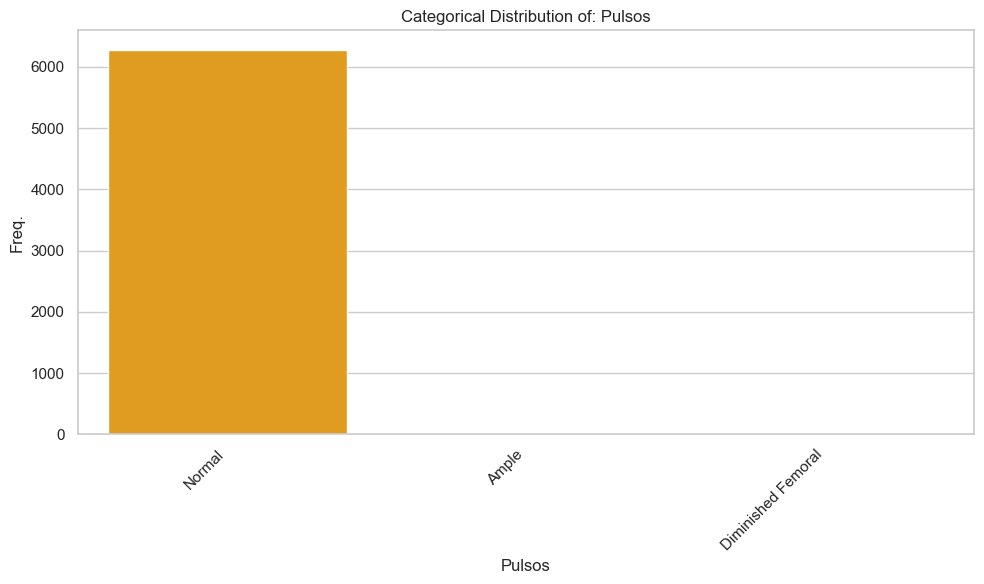

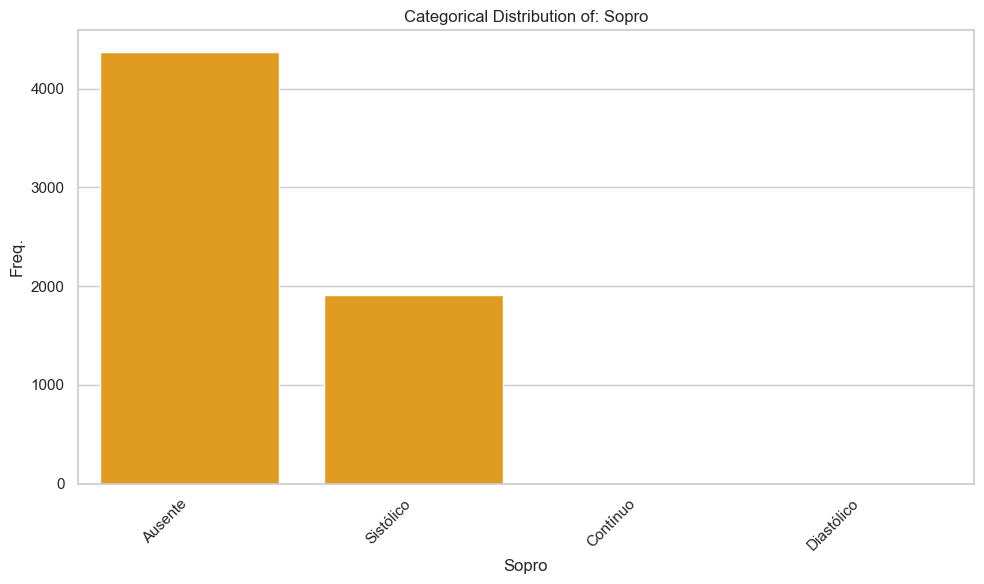

...

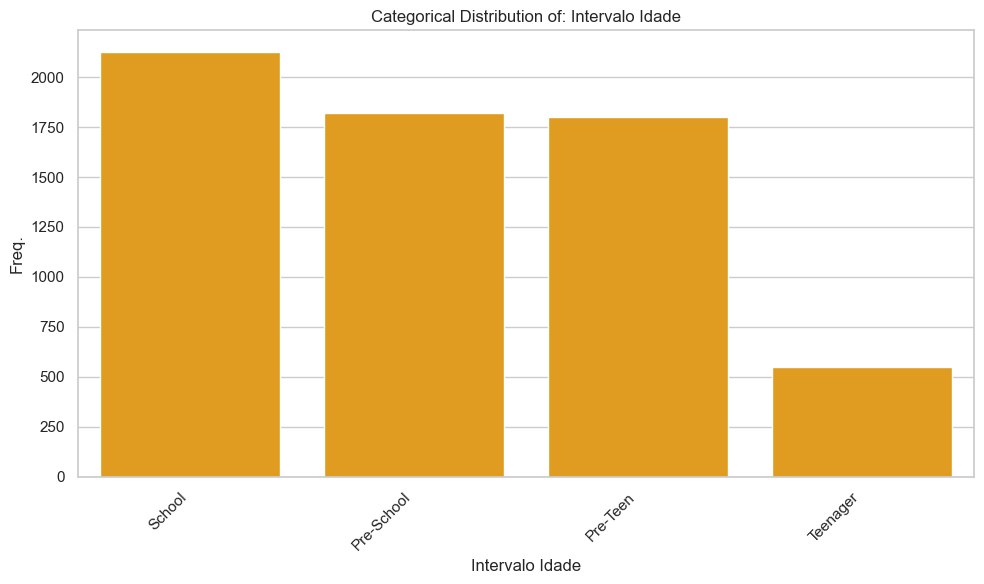

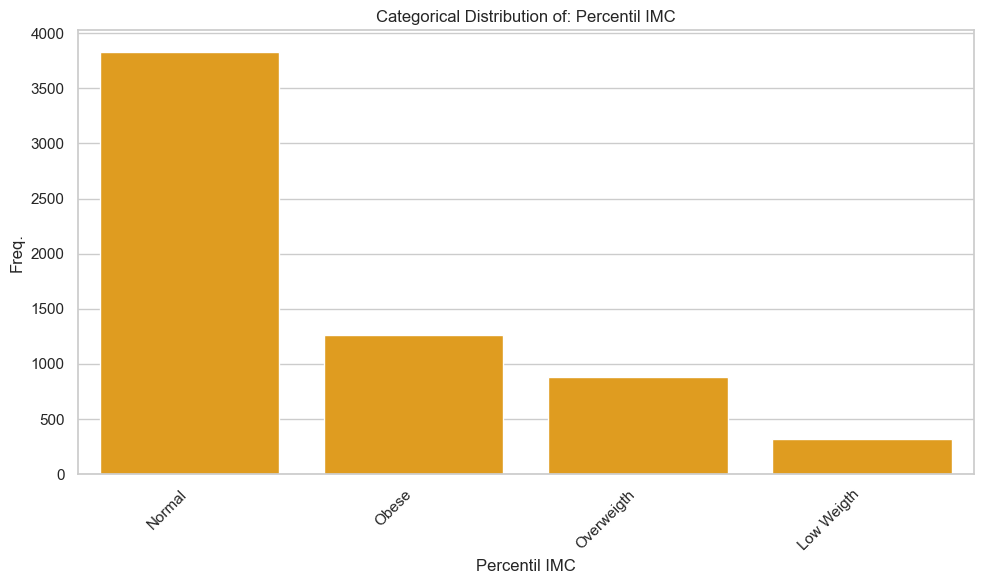

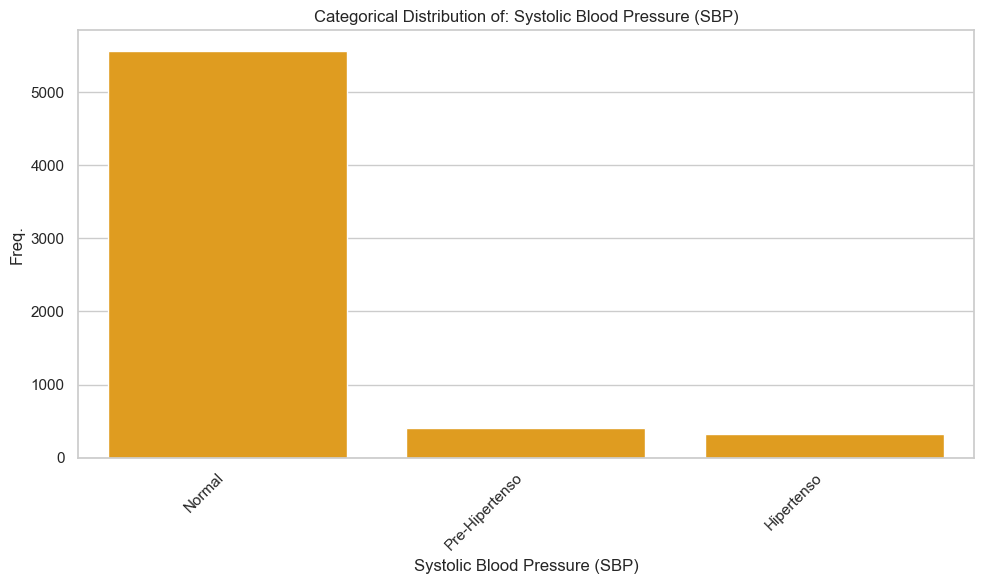

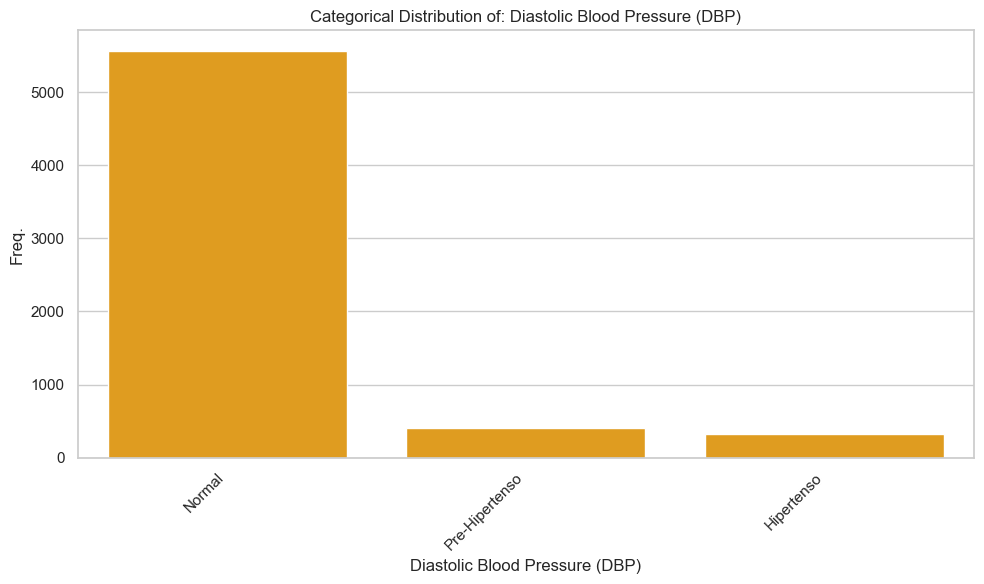

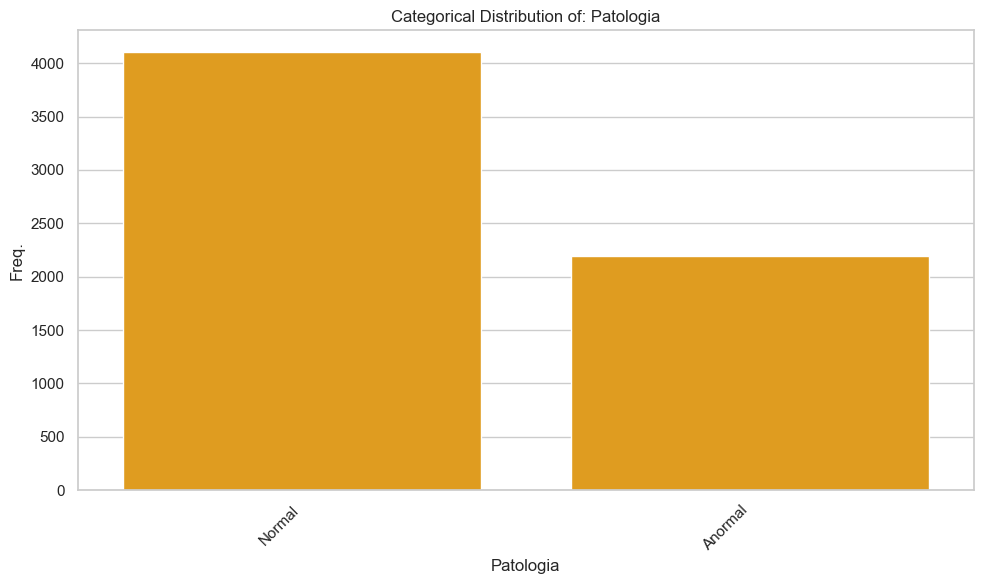

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np


# 1. Definir as listas de features com base na sua imagem
# (Excluindo 'ID')

# Features Numéricas (Ratio ou Interval) para Histogramas
numeric_features = [
    'Peso', 'Altura', 'IMC', 'Idade', 
    'SBP', 'DBP', 'FC'
]

# Features Categóricas (Nominal) para Gráficos de Barras
# Nota: 'Atendimento' e 'DN' são Intervalo (datas) na tabela,
# mas são melhor visualizados como categorias (countplots).
categorical_features = [
    'Pulsos', 'Result SBP-DBP','B2', 'Pulsos', 'Sopro',
    'HDA1', 'HDA2', 'Sexo', 'Motivo1', 'Motivo2',
    'Intervalo Idade', 'Percentil IMC', 'Systolic Blood Pressure (SBP)',
    'Diastolic Blood Pressure (DBP)', 'Patologia'
]

sns.set_style("whitegrid")

# --- 2. Plot Histograms for numerical features---
print("--- Generating Histograms for Numerical Features ---")
for feature in numeric_features:
    plt.figure(figsize=(8, 5))
    
    # Usar .dropna() para remover valores NaN (missing) antes de plotar
    # O 'bins='fd'' (Freedman-Diaconis) pode falhar se houver muitos NaNs
    try:
        data_to_plot = data[feature]
        plt.hist(data_to_plot, bins='fd', color='steelblue', edgecolor='black')
        plt.title(f'Histogram of: {feature}')
        plt.xlabel(feature)
        plt.ylabel('Freq')
    except Exception as e:
        print(f"Could make the plot of {feature} (maybe 'fd' failed): {e}")
        
    plt.show() 


# --- 3. Plot Countplots for Categorical Features---
print("\n--- Generating Countplot for Categorical Features---")
for feature in categorical_features:
    # Criar uma nova figura para cada plot
    plt.figure(figsize=(10, 6))
    
    # Usar sns.countplot para a visualização categórica "correta"
    
    # Calcular a ordem (do mais frequente para o menos frequente)
    try:
        # Obter o N de categorias únicas
        n_unique = data[feature].nunique()
        
        plot_title = f'Categorical Distribution of: {feature}'
        order = data[feature].value_counts().index
        
        # Ajuste para alta cardinalidade (ex: 'Atendimento', 'DN')
        # Se houver mais de 25 categorias, plotamos apenas as 25 principais
        if n_unique > 25:
            plot_title = f'Distribution of : {feature} (Top 25 Categories)'
            # Pegar o índice das 25 principais
            top_25 = order[:25]
            # Filtrar dados para plotar apenas o top 25
            plot_data = data[data[feature].isin(top_25)]
            sns.countplot(x=feature, data=plot_data, color='orange', order=top_25)
        else:
            # Plotar todas as categorias se forem 25 ou menos
            sns.countplot(x=feature, data=data, color='orange', order=order)
        
        plt.title(plot_title)
        plt.xlabel(feature)
        plt.ylabel('Freq.')
        
        # Rotacionar os labels do eixo X para melhor leitura
        plt.xticks(rotation=45, ha='right')
        
    except Exception as e:
        print(f"Could not plot {feature} (maybe a error of data type): {e}")

    plt.tight_layout() # Ajusta o layout para evitar que os labels sejam cortados
    plt.show() # Exibe o gráfico imediatamente

### 1.3.3 Boxplots

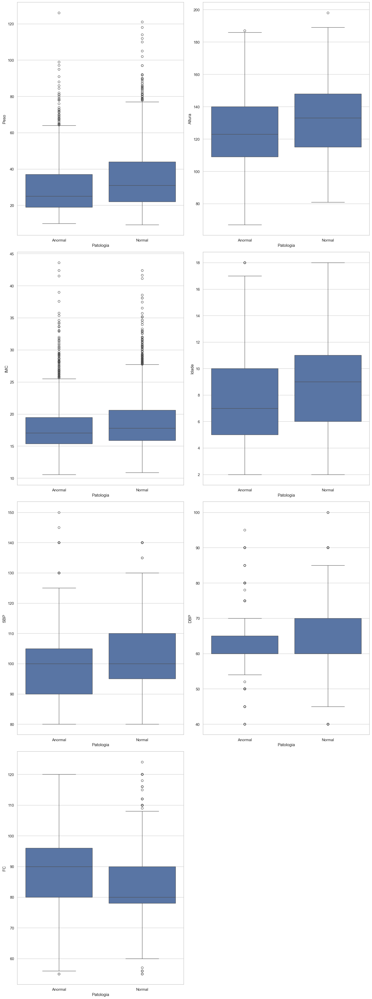

In [31]:
def graph(y):
    sns.boxplot(x="Patologia", y=y, data=data)

plt.figure(figsize=(15, 40)) 

plt.subplot(421)
graph('Peso')
plt.subplot(422)
graph('Altura')
plt.subplot(423)
graph('IMC')
plt.subplot(424)
graph('Idade')
plt.subplot(425)
graph('SBP')
plt.subplot(426)
graph('DBP')
plt.subplot(427) 
graph('FC')

plt.tight_layout() 

### 1.3.4  Spread measures  

In [37]:
# SUB-PLOT 1 (Boxplot): Foca na estatística posicional. Visualiza o IQR (50% centrais), 
# amplitude, outliers e assimetria (comparação entre média e mediana).

# SUB-PLOT 2 (Histograma/KDE): Foca na forma e densidade. A curva KDE indica o 
# espalhamento, enquanto as linhas verticais delimitam o Desvio Padrão, 
# zona de maior probabilidade(correspondem 68% dos dados).

# MÉTRICAS: Painel lateral com Amplitude, IQR, Variância, DP e CV (dispersão relativa).

def plot_spread_measures(df, variable, stats):
    """

    Visualização combinada de dispersão:
        1. Boxplot: Identifica quartis (IQR), limites de amplitude e outliers.
        2. Histograma/KDE: Exibe a distribuição, densidade e dispersão em torno da média (DP).
        3. Estatísticas: Sumário numérico das principais métricas de variabilidade.
        
    Argumentos:
        df (pd.DataFrame): O conjunto de dados original.
        variable (str): Nome da coluna numérica a ser analisada.
        stats (dict): Dicionário com métricas pré-calculadas (media, std, iqr, etc.).
        
    Retorna:
        Um gráfico com Boxplot (foco em quartis e outliers) e 
        Histograma (foco em densidade e desvio padrão).
    """
    
    # Configuração da Figura
    fig, (ax_box, ax_hist) = plt.subplots(2, sharex=True, 
                                           gridspec_kw={"height_ratios": (.15, .85)}, 
                                           figsize=(10, 6))
    
    # Boxplot (usando os dados brutos para os quartis automáticos)
    sns.boxplot(x=df[variable], ax=ax_box, color='lightgreen', showmeans=True,
                meanprops={"marker":"o", "markerfacecolor":"white", "markeredgecolor":"black"})
    ax_box.set(xlabel='')
    ax_box.set_title(f'Análise de Dispersão: {variable}', fontsize=14)
    
    # 2. Histograma
    sns.histplot(df[variable], kde=True, ax=ax_hist, color='lightgreen', stat="density")
    
    # Linhas de referência usando os argumentos passados
    media = stats['media']
    std = stats['std']
    
    ax_hist.axvline(media, color='red', linestyle='--', label=f"Média: {media:.2f}")
    ax_hist.axvline(media + std, color='orange', linestyle=':', label=f"Média ± 1 Desvio Padrão")
    ax_hist.axvline(media - std, color='orange', linestyle=':')
    
    # 3. Caixa de Texto com as medidas externas
    textstr = '\n'.join((
        f"Amplitude: {stats['amplitude']:.2f}",
        f"IQR: {stats['iqr']:.2f}",
        f"Variância: {stats['variancia']:.2f}",
        f"Desvio Padrão: {std:.2f}",
        f"CV: {stats['cv']:.2f}%"
    ))
    
    props = dict(boxstyle='round', facecolor='white', alpha=0.8)
    ax_hist.text(0.98, 0.5, textstr, transform=ax_hist.transAxes, fontsize=10,
                verticalalignment='center', horizontalalignment='right', bbox=props)

    ax_hist.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

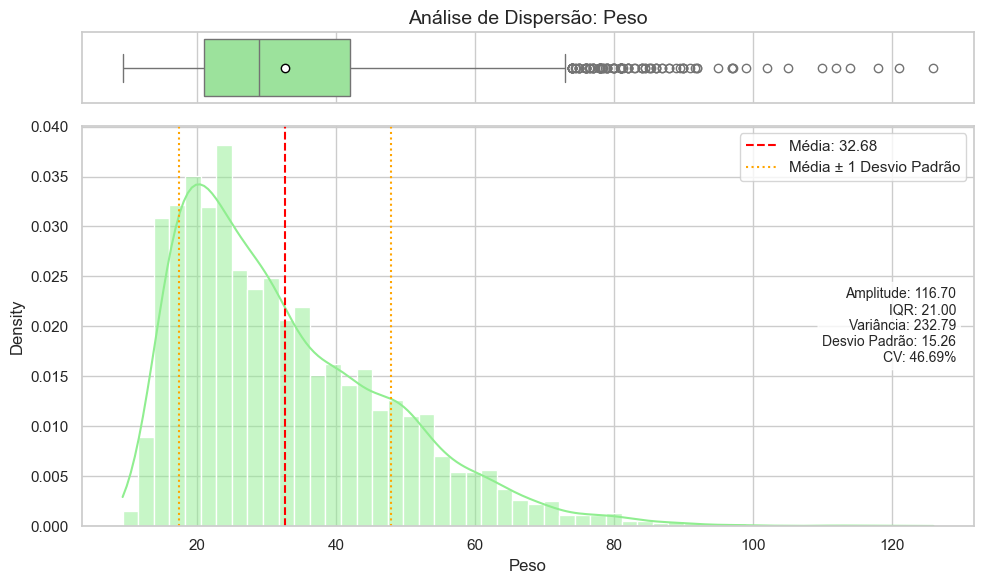

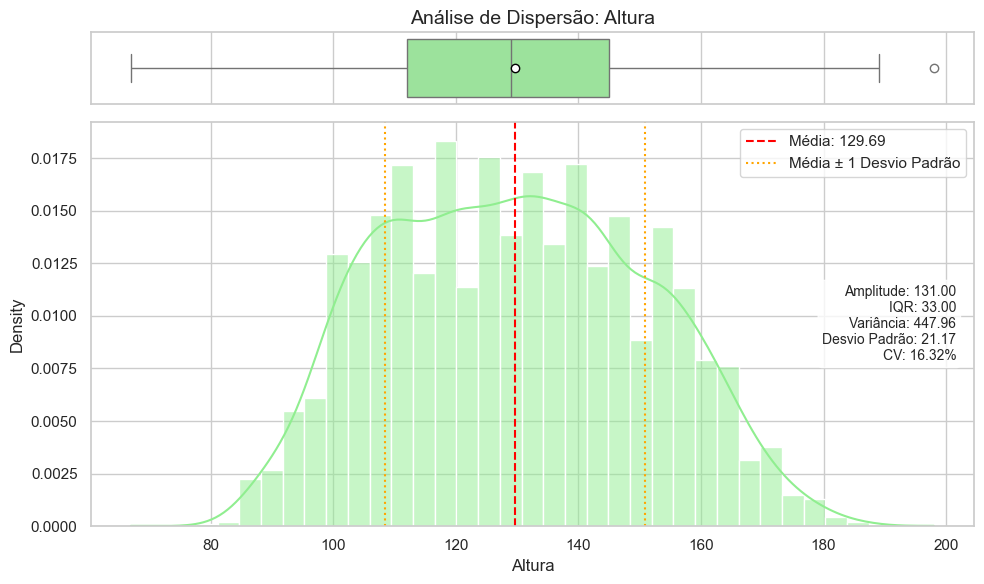

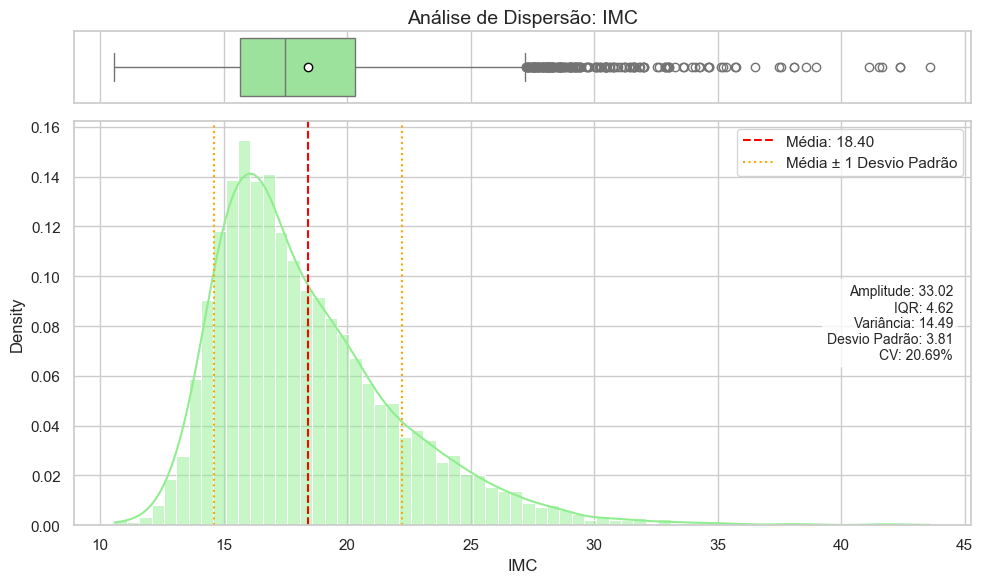

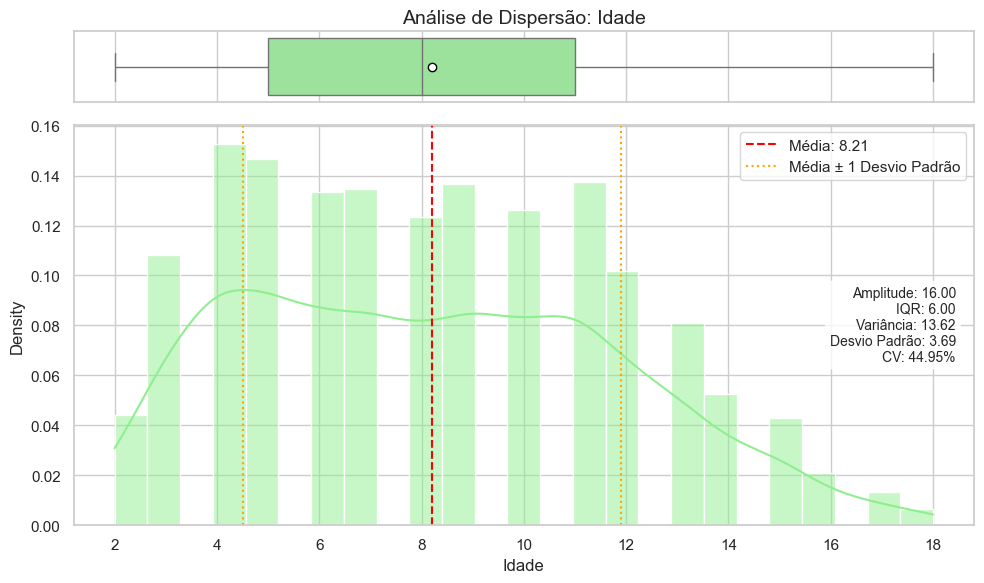

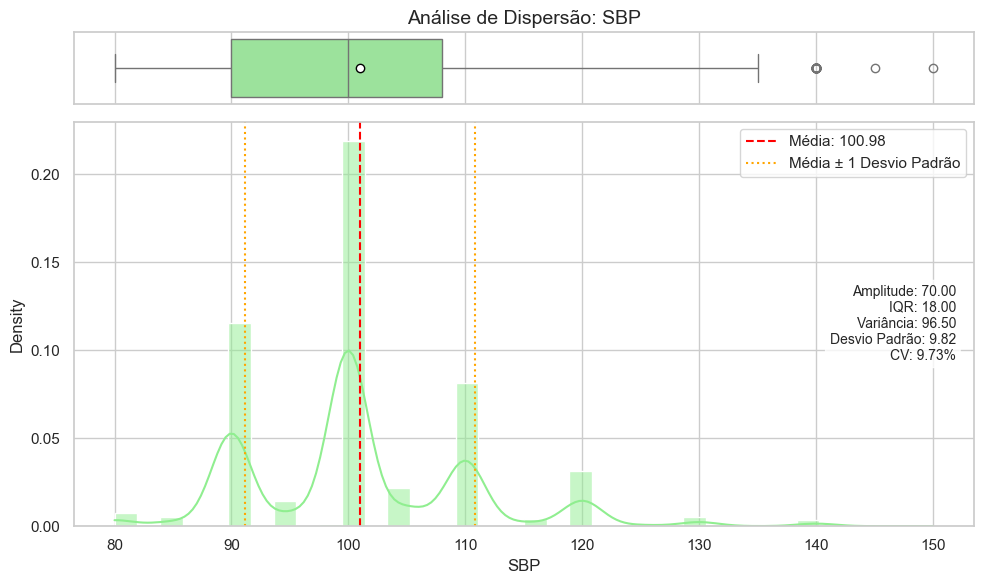

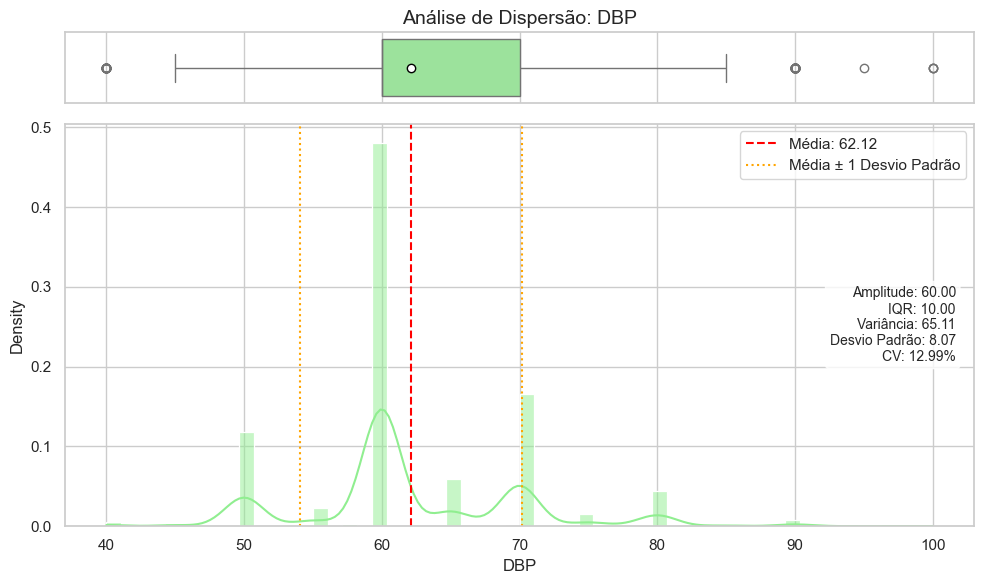

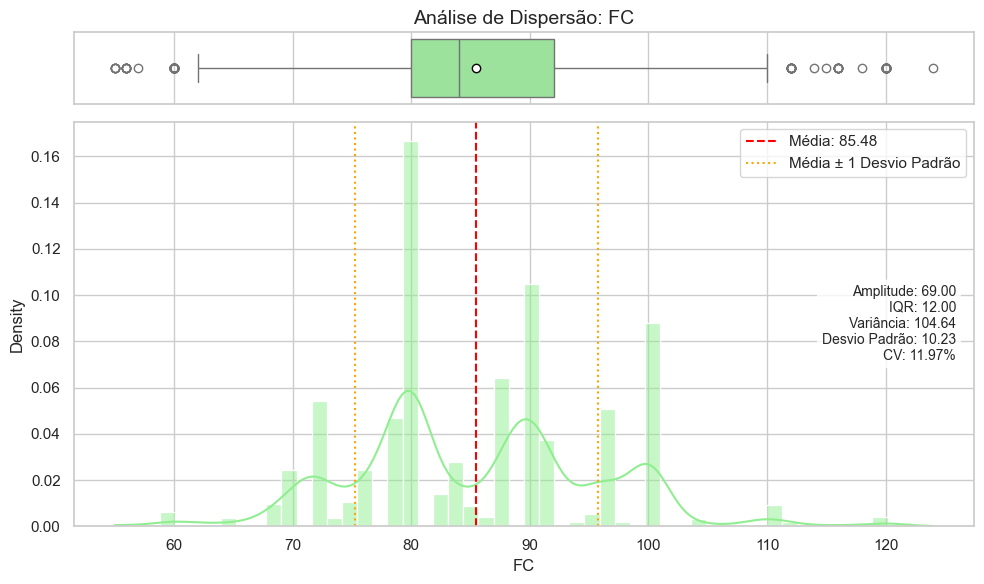

In [38]:
variaveis_numericas = [
    'Peso', 'Altura', 'IMC', 'Idade', 
    'SBP', 'DBP', 'FC'
]

for variable in variaveis_numericas:
    q1 = data[variable].quantile(0.25)
    q3 = data[variable].quantile(0.75)
    desvio_padrao = data[variable].std()
    media = data[variable].mean()

    # Organizando os resultados para a função
    medidas = {
        'amplitude': data[variable].max() - data[variable].min(),
        'iqr': q3 - q1,
        'variancia': data[variable].var(),
        'std': desvio_padrao,
        'media': media,
        'cv': (desvio_padrao / media) * 100
    }

    plot_spread_measures(data, variable, medidas)

### 1.3.5 Density

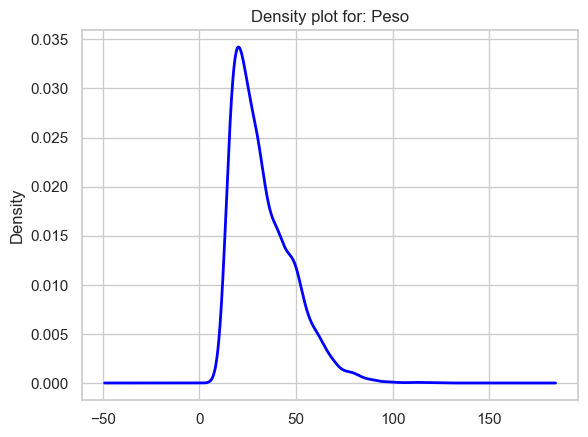

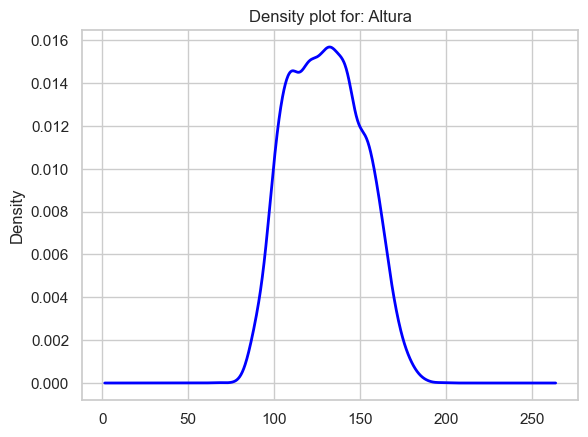

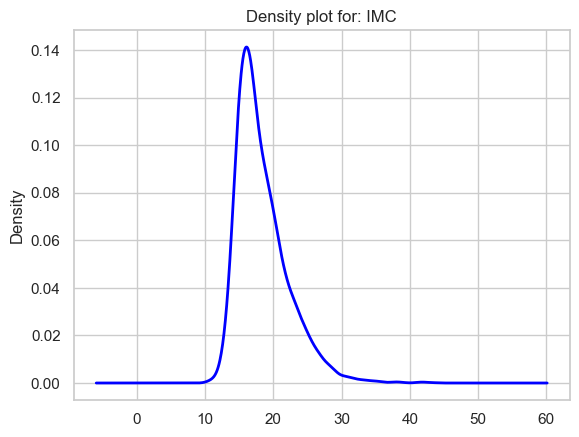

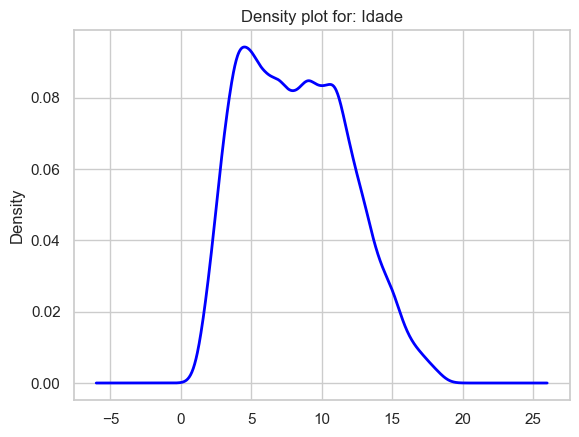

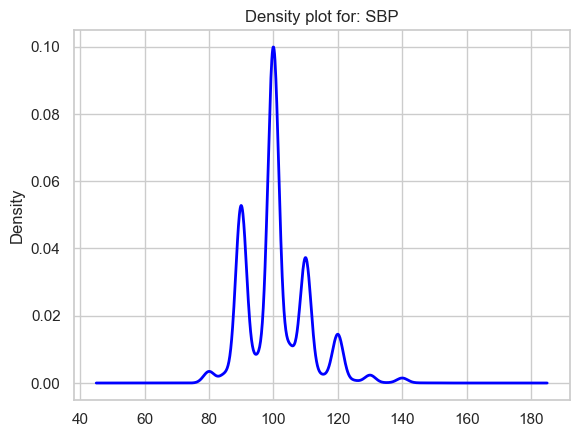

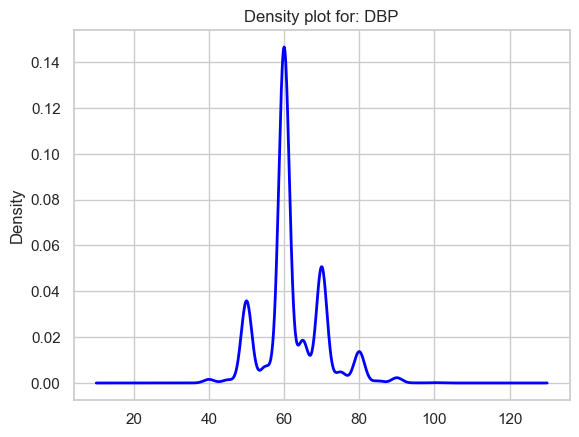

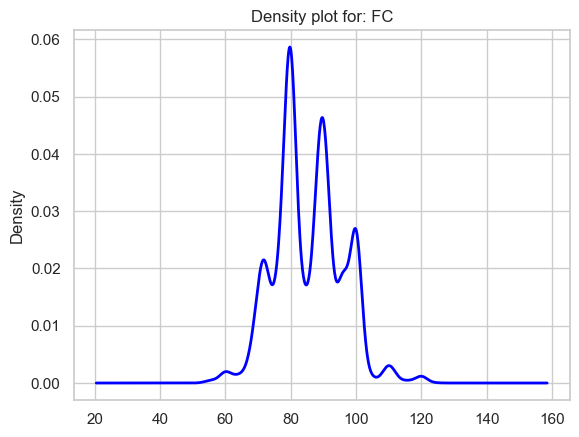

In [40]:
variaveis_numericas = [
    'Peso', 'Altura', 'IMC', 'Idade', 
    'SBP', 'DBP', 'FC'
]
for variable in variaveis_numericas:
    data[variable].plot.kde(bw_method='scott',color='blue',linestyle='-', linewidth=2)
    plt.title("Density plot for: " + variable)
    plt.show()

### 1.3.6 Correlation

In [41]:

corr_matrix = data.corr(numeric_only = True,method='pearson').round(2)
corr_matrix.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)


,Peso,Altura,IMC,Idade,SBP,DBP,FC
Peso,1.00,0.88,0.77,0.81,0.60,0.47,-0.40
Altura,0.88,1.00,0.42,0.93,0.52,0.39,-0.48
IMC,0.77,0.42,1.00,0.38,0.51,0.41,-0.19
Idade,0.81,0.93,0.38,1.00,0.49,0.38,-0.47
SBP,0.60,0.52,0.51,0.49,1.00,0.71,-0.19
DBP,0.47,0.39,0.41,0.38,0.71,1.00,-0.12
FC,-0.40,-0.48,-0.19,-0.47,-0.19,-0.12,1.00


<Axes: >

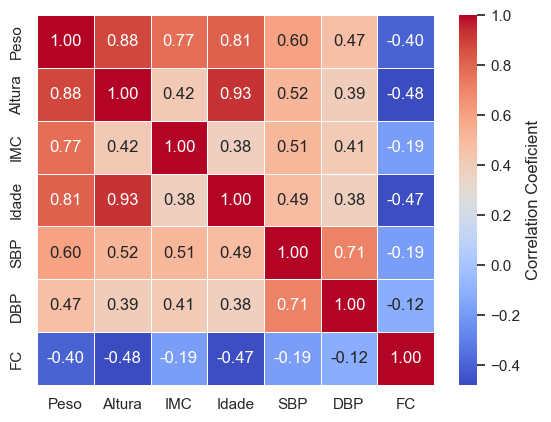

In [42]:
sns.heatmap(
    corr_matrix,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    linewidths=.5,
    cbar_kws={'label': 'Correlation Coeficient'}
    )

## 1.4 Visualization of Linear Relationships of columns (Only Continuous Numerical Variables)

For determining Linear Relationships between **Only Numerical values** we will be using ```correlation``` and ```correlation matrix``

In [43]:
# Printing the unique value count
indent = '{:<3} {:<30}: {}'
print('Unique value count for: ')
for i, feature in enumerate(list(data.columns)[:-1], start = 1):
    print(indent.format(f'{i}.', feature, data[feature].nunique()))

Unique value count for: 
1.  Peso                          : 550
2.  Altura                        : 110
3.  IMC                           : 1373
4.  Idade                         : 17
5.  Pulsos                        : 3
6.  SBP                           : 28
7.  DBP                           : 30
8.  Result SBP-DBP                : 3
9.  B2                            : 4
10. Sopro                         : 4
11. FC                            : 49
12. HDA1                          : 7
13. HDA2                          : 7
14. Sexo                          : 2
15. Motivo1                       : 5
16. Motivo2                       : 6
17. Intervalo Idade               : 4
18. Percentil IMC                 : 4
19. Systolic Blood Pressure (SBP) : 3
20. Diastolic Blood Pressure (DBP): 3


### 

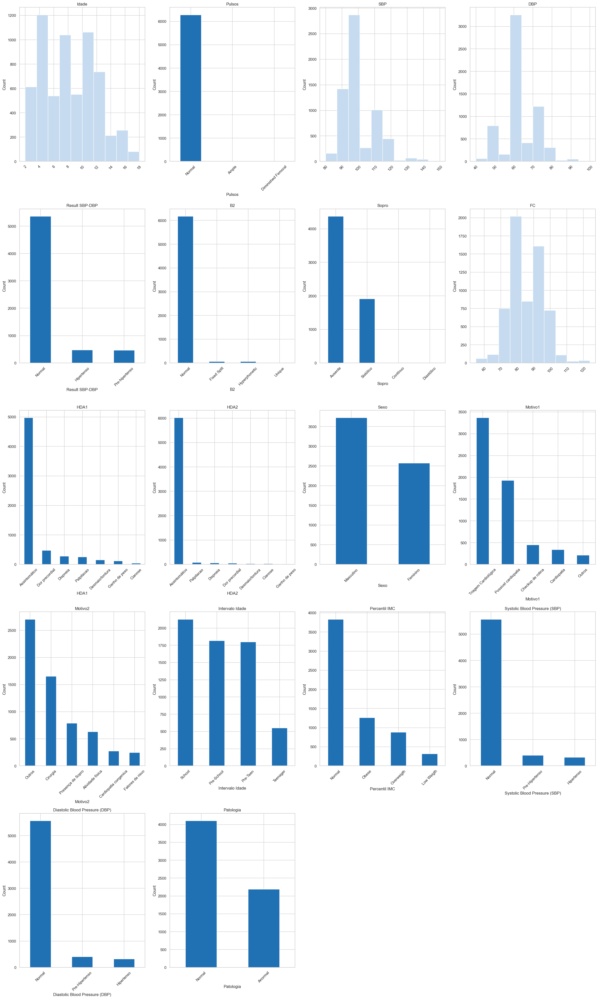

In [45]:

'''Generating a set of visualizations for columns that have more than one unique value but less than 50 unique values.
For categorical columns, a bar plot is generated showing the count of each unique value.
For numerical columns, a histogram is generated.'''
unique_values = data.nunique()
selected_cols = data[[col for col in data if 1 < unique_values[col] < 50]]
rows, cols = selected_cols.shape
col_names = list(selected_cols)
num_of_rows = (cols + 3) // 4

color_palette = sns.color_palette('Blues', n_colors = 3)
plt.figure(figsize = (6 * 4, 8 * num_of_rows))

for i in range(cols):
    plt.subplot(num_of_rows, 4, i + 1)
    col_data = selected_cols.iloc[:, i]
    if col_data.dtype.name == 'object':
        col_data.value_counts().plot(kind = 'bar', color = color_palette[2])
    else:
        col_data.hist(color = color_palette[0])

    plt.ylabel('Count')
    plt.xticks(rotation = 45)
    plt.title(col_names[i])

plt.tight_layout()
plt.show()

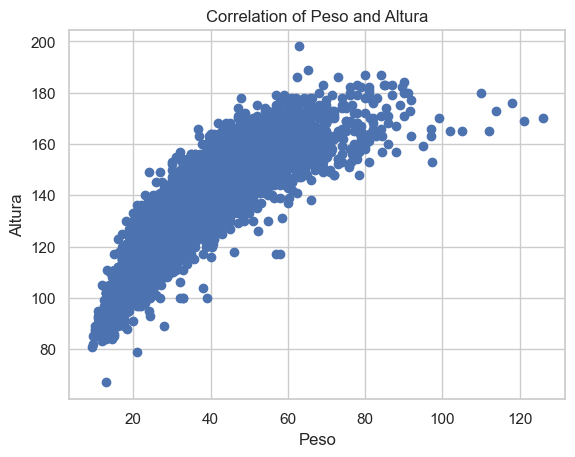

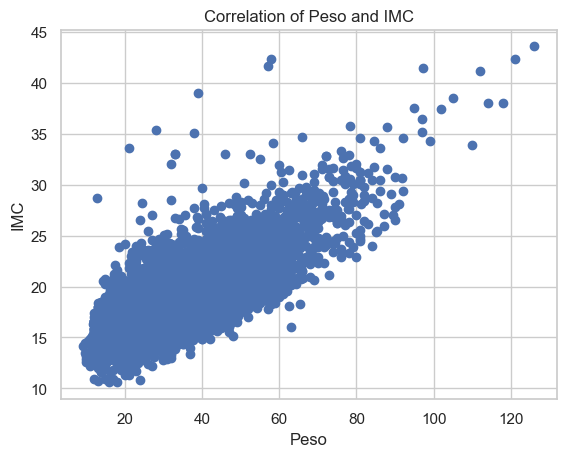

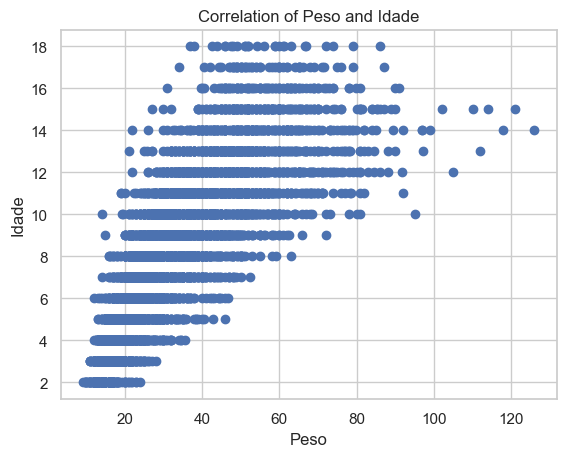

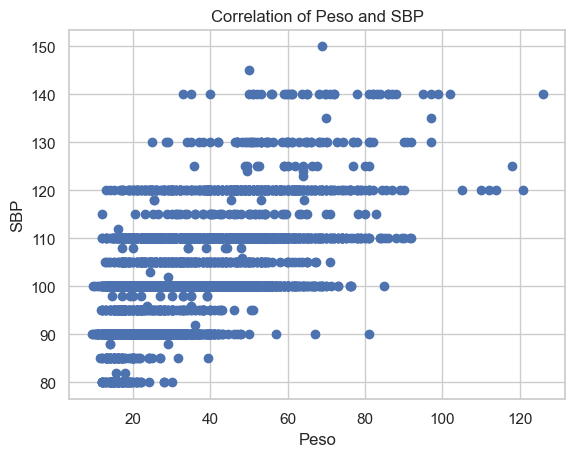

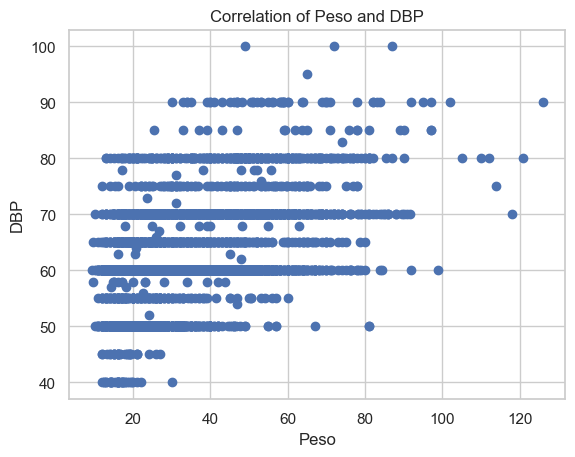

...

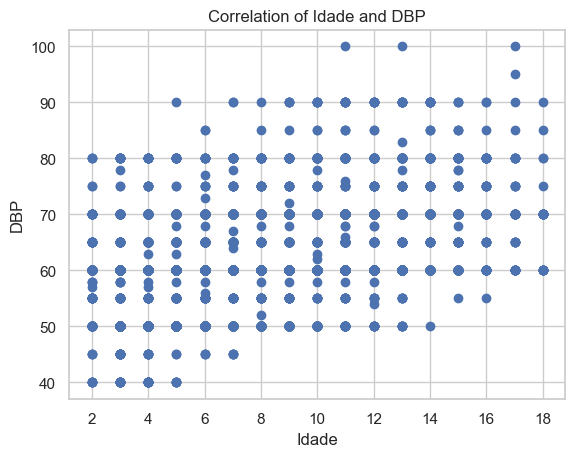

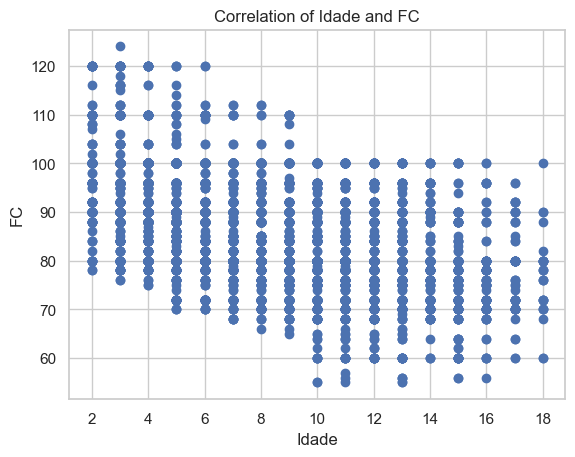

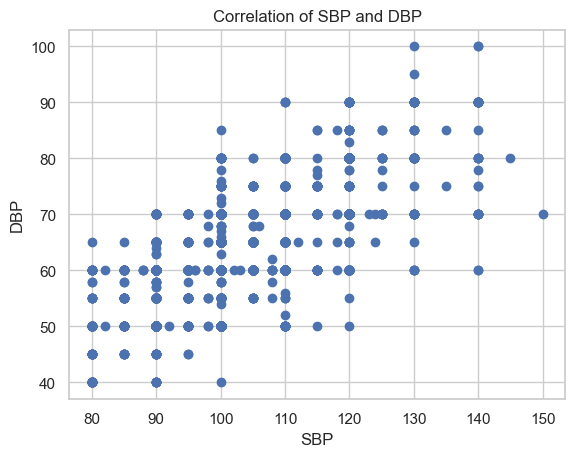

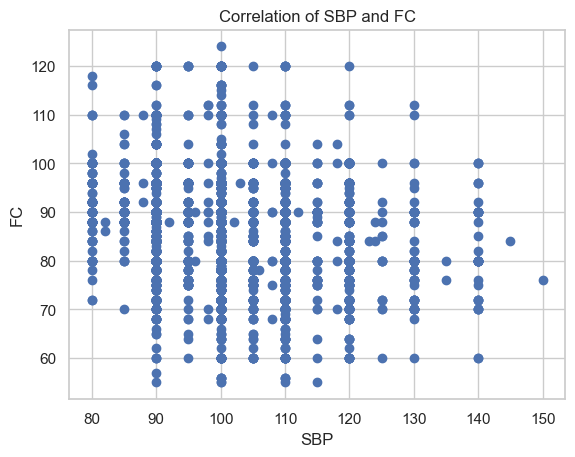

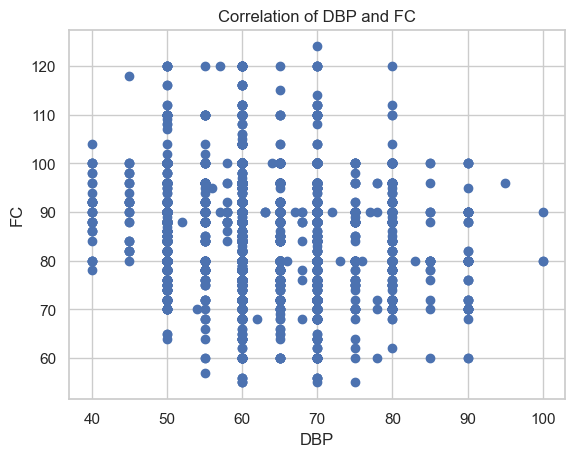

In [48]:
variaveis_numericas = [
    'Peso', 'Altura', 'IMC', 'Idade', 
    'SBP', 'DBP', 'FC'
]
for i in range(0,len(variaveis_numericas)):
    for j in range (i,len(variaveis_numericas)):
        if (i!=j):
            x = data[variaveis_numericas[i]]
            y = data[variaveis_numericas[j]]
            corr = y.corr(x)
            # plotting the data
            plt.scatter(x, y)
            # This will fit the best line into the graph
            plt.title(f'Correlation of {variaveis_numericas[i]} and {variaveis_numericas[j]}')
            plt.xlabel(variaveis_numericas[i])
            plt.ylabel(variaveis_numericas[j])
            plt.show()

In [50]:
# Identifying outliers
numeric_data = data.select_dtypes(include = ['float', 'int'])
q1 = numeric_data.quantile(0.25)
q3 = numeric_data.quantile(0.75)
iqr = q3 - q1
outlier = (numeric_data < (q1 - 1.5 * iqr)) | (numeric_data > (q3 + 1.5 * iqr))
outlier_count = outlier.sum()
outlier_percentage = round(outlier.mean() * 100, 2)
outlier_stats = pd.concat([outlier_count, outlier_percentage], axis = 1)
outlier_stats.columns = ['Outlier Count', 'Outlier Percentage']

print(outlier_stats)

        Outlier Count  Outlier Percentage
Peso              104                1.65
Altura              1                0.02
IMC               179                2.84
Idade               0                0.00
SBP                42                0.67
DBP                90                1.43
FC                120                1.91


In [ ]:
# Identifying outliers based on Patologia
df_proc = data.copy()
outlier_counts = {}

for i in numeric_data:
    # Usamos .unique() para não repetir cálculos desnecessários
    for patologia in df_proc['Patologia'].unique():
        
        # Extraímos os dados e removemos NaNs da variável numérica com .dropna()
        patologia_data = df_proc[df_proc['Patologia'] == patologia][i].dropna()
        
        if len(patologia_data) > 0:
            # Cálculo dos quartis (agora seguro sem NaNs)
            q1, q3 = np.percentile(patologia_data , [25, 75])
            iqr = q3 - q1
            
            lower_bound = q1 - 1.5 * iqr
            upper_bound = q3 + 1.5 * iqr
            
            # Contagem de outliers
            num_outliers = ((patologia_data < lower_bound) | (patologia_data > upper_bound)).sum()
            outlier_percent = (num_outliers / len(patologia_data)) * 100
            
            outlier_counts[(i, patologia)] = (num_outliers, outlier_percent)
        else:
            outlier_counts[(i, patologia)] = (0, 0.0)

for i in numeric_data:
    print(f'Feature: {i}')
    for patologia in df_proc['Patologia'].unique():
        if (i, patologia) in outlier_counts:
            num_outliers, outlier_percent = outlier_counts[(i, patologia)]
            print(f'  - {patologia}: {num_outliers} ({outlier_percent:.2f}%)')
    print("-" * 20)

Feature: Peso
  - Anormal: 61 (2.79%)
  - Normal: 56 (1.36%)
--------------------
Feature: Altura
  - Anormal: 1 (0.05%)
  - Normal: 1 (0.02%)
--------------------
Feature: IMC
  - Anormal: 95 (4.34%)
  - Normal: 97 (2.36%)
--------------------
Feature: Idade
  - Anormal: 7 (0.32%)
  - Normal: 0 (0.00%)
--------------------
Feature: SBP
  - Anormal: 45 (2.05%)
  - Normal: 22 (0.54%)
--------------------
Feature: DBP
  - Anormal: 424 (19.36%)
  - Normal: 65 (1.58%)
--------------------
Feature: FC
  - Anormal: 2 (0.09%)
  - Normal: 71 (1.73%)
--------------------


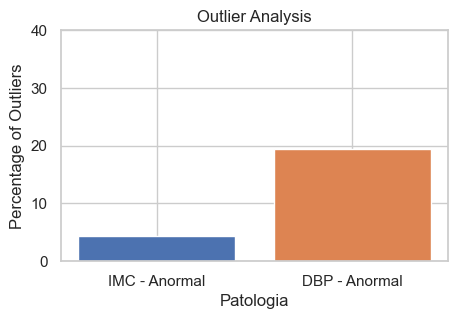

In [56]:
# Plotting the percentage of outliers that are higher than 3%
fig, ax = plt.subplots(figsize = (5, 3))
for i in numeric_data:
    for patologia in df_proc['Patologia'].unique():
        num_outliers, outlier_percent = outlier_counts[(i, patologia)]
        if outlier_percent > 3:
            ax.bar(f'{i} - {patologia}', outlier_percent)

ax.set_xlabel('Patologia')
ax.set_ylabel('Percentage of Outliers')
ax.set_title('Outlier Analysis')
ax.set_yticks(np.arange(0, 41, 10))
plt.xticks(rotation = 0)
plt.show()

## 1.5 Visualization of Linear Relationships of columns (Only Categorical Variables)

For determining Linear Relationships between **Only Categorical values** we will be using ```stacked bar chart```

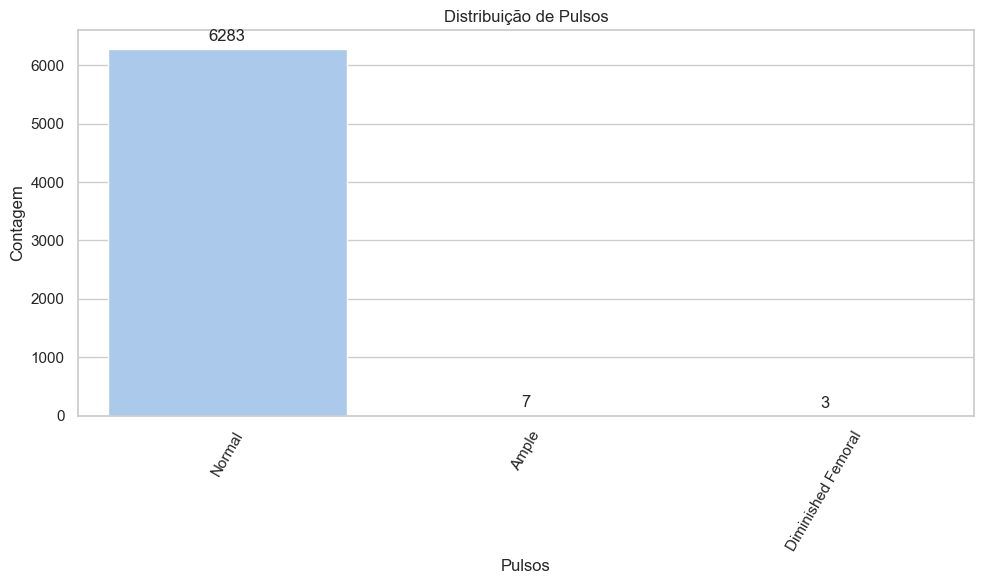

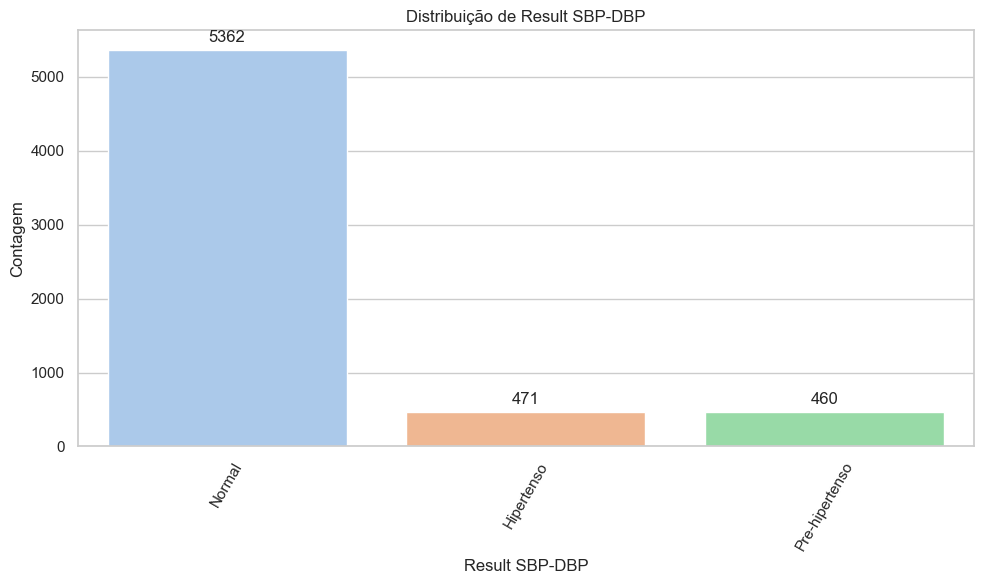

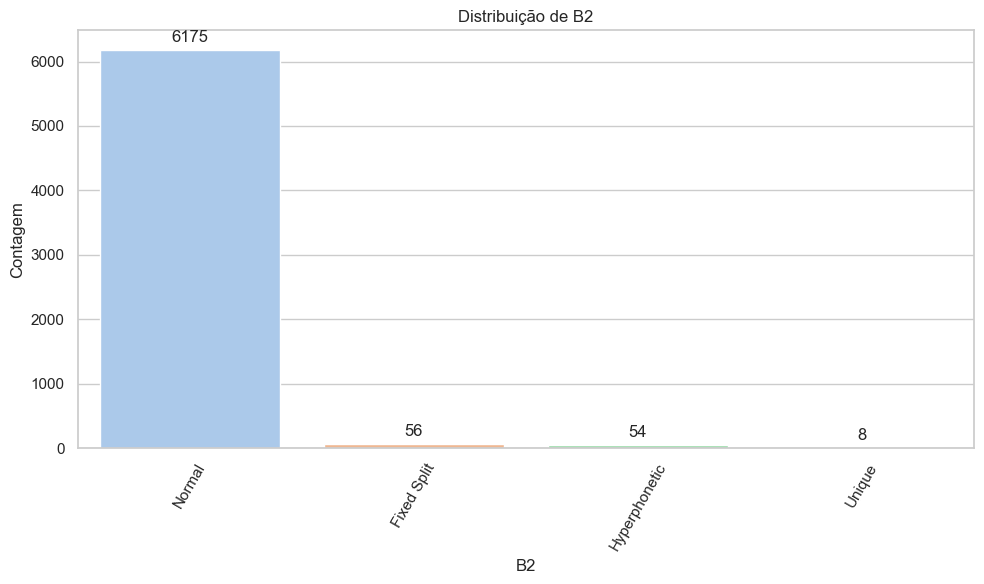

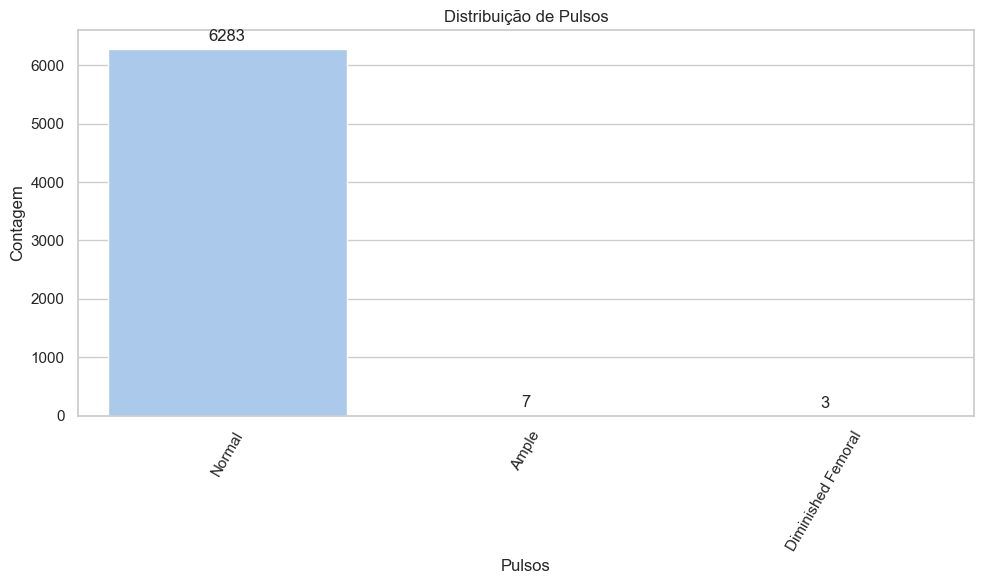

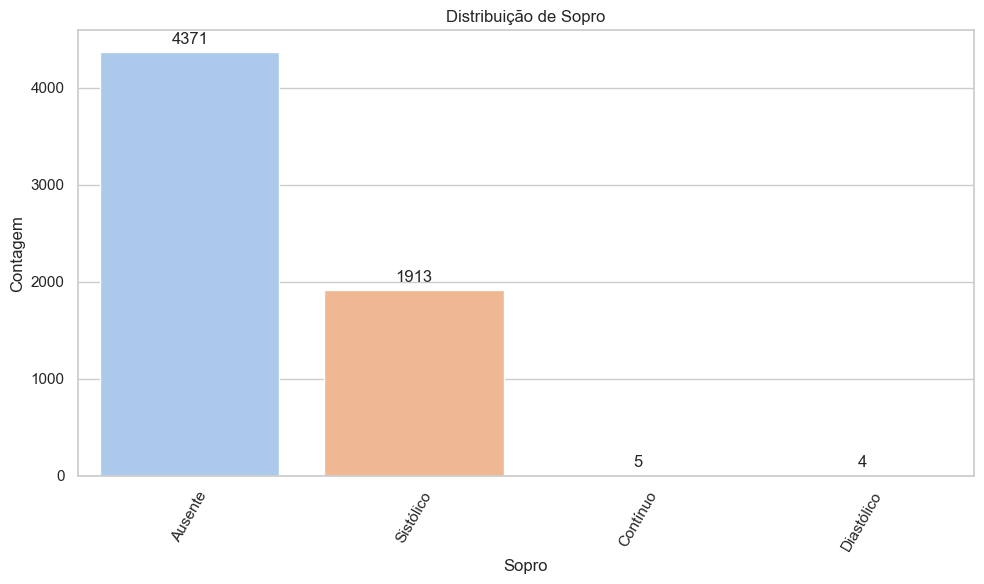

...

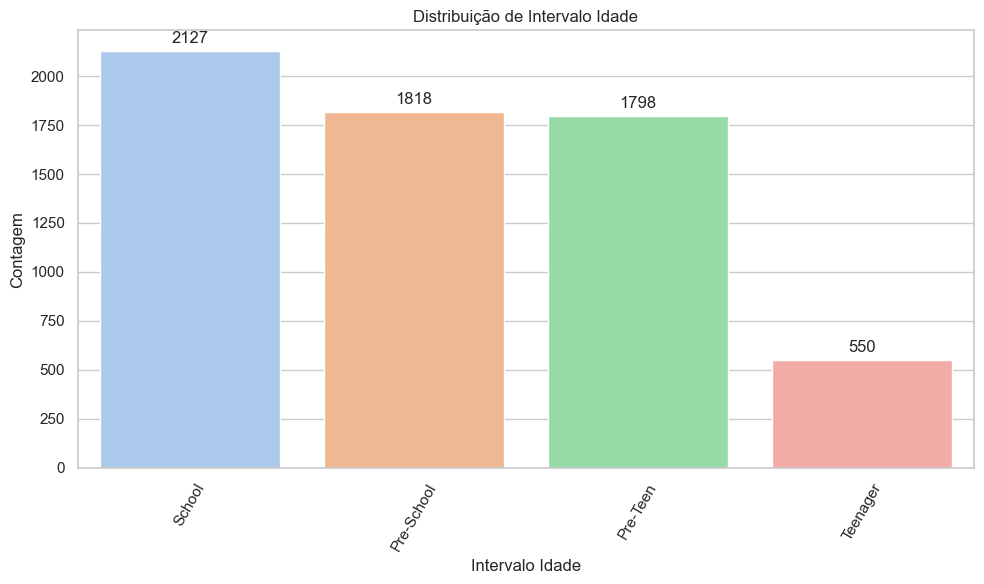

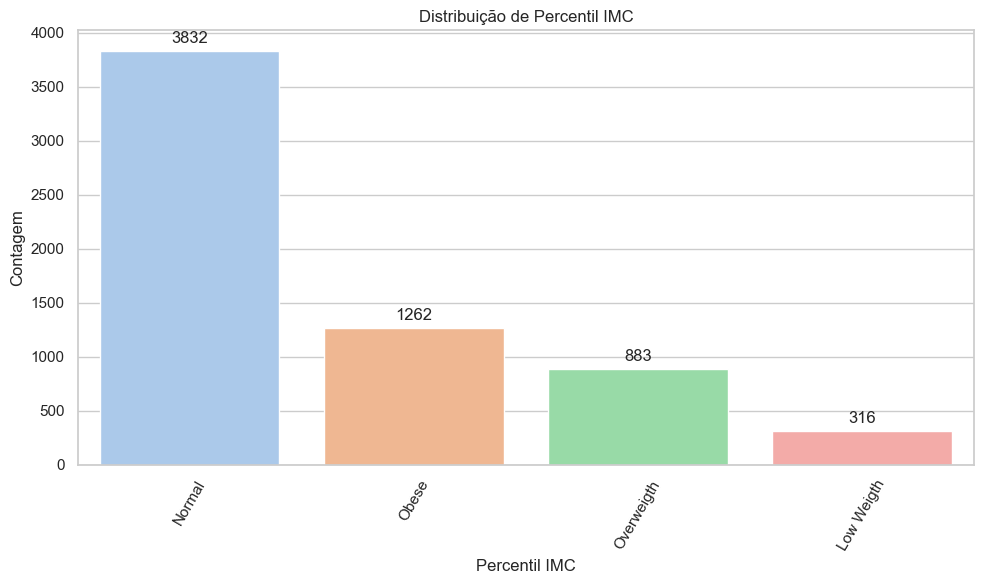

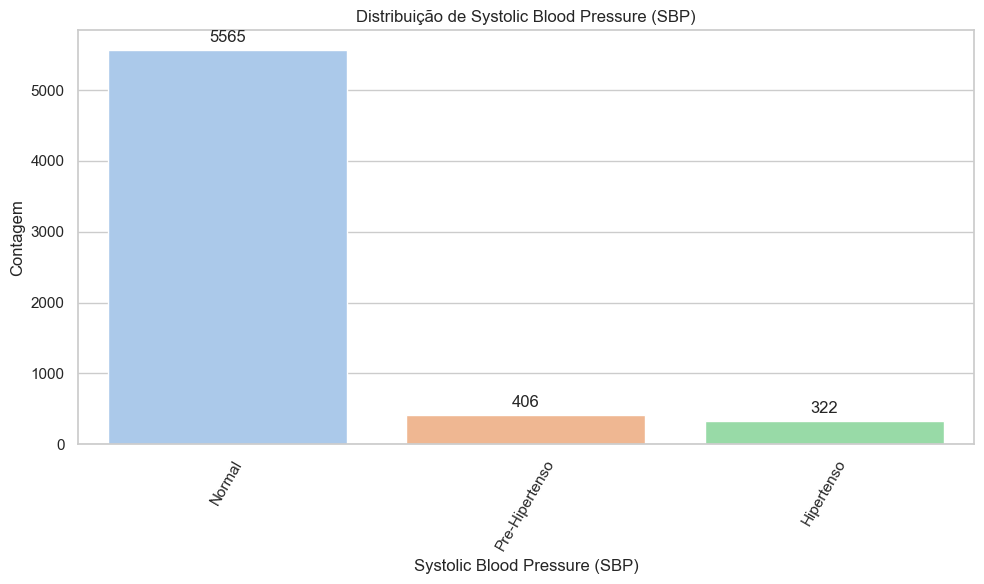

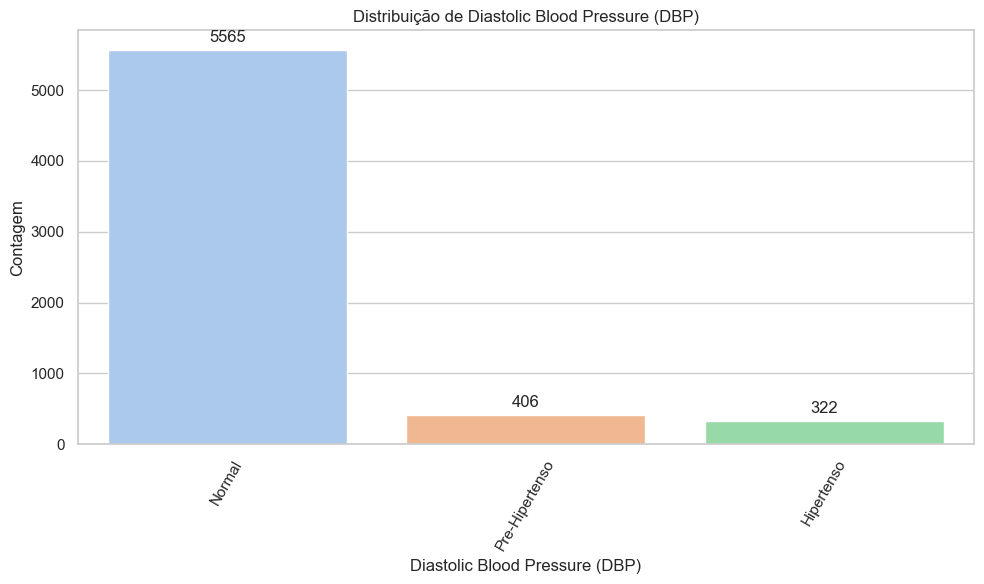

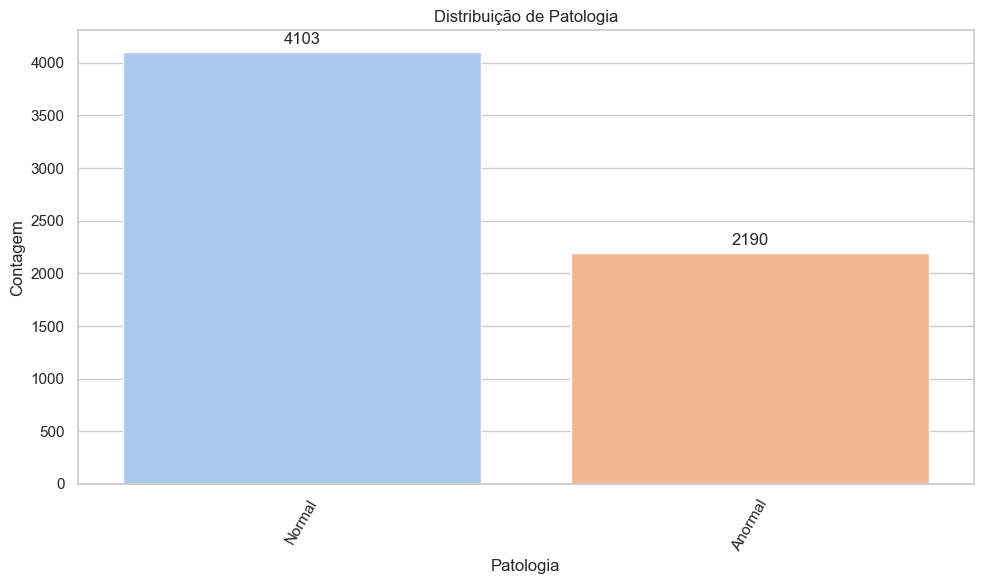

In [58]:
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)

variaveis_categoricas = [
    'Pulsos', 'Result SBP-DBP','B2', 'Pulsos', 'Sopro',
    'HDA1', 'HDA2', 'Sexo', 'Motivo1', 'Motivo2',
    'Intervalo Idade', 'Percentil IMC', 'Systolic Blood Pressure (SBP)',
    'Diastolic Blood Pressure (DBP)', 'Patologia'
]

for variable in variaveis_categoricas:
    plt.figure(figsize = (10, 6))
    
    # 1. Passamos o dataframe 'data' e a string da variável no 'x'
    # 2. O 'order' garante que as barras fiquem da maior para a menor
    ax = sns.countplot(
        x = variable, 
        data = data, 
        palette = 'pastel',
        order = data[variable].value_counts().index
    )
    
    plt.title('Distribuição de ' + variable)
    plt.xlabel(variable)
    plt.ylabel('Contagem')
    plt.xticks(rotation = 60) 

    # Adicionando as anotações (os números sobre as barras)
    for p in ax.patches:
        # Calculamos a altura da barra para posicionar o texto
        height = p.get_height()
        # Verificamos se a altura não é nula para evitar erros de anotação
        if height > 0:
            ax.annotate(
                f'{height:.0f}', 
                (p.get_x() + p.get_width() / 2., height), 
                ha = 'center', 
                va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points'
            )

    plt.tight_layout() # Ajusta o layout para não cortar os nomes no fundo
    plt.show()
     

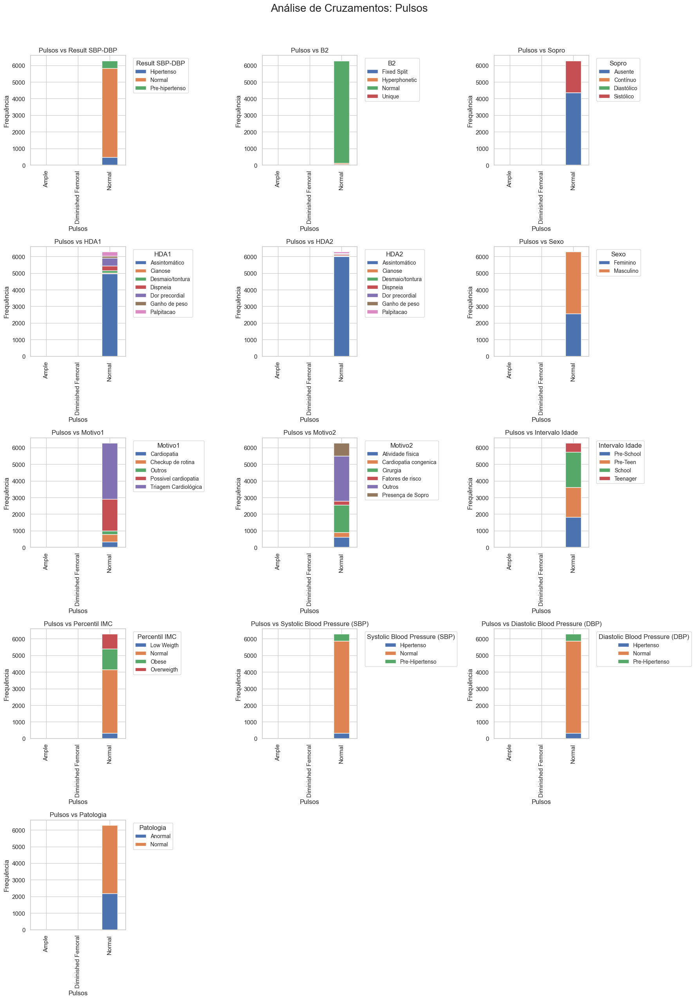

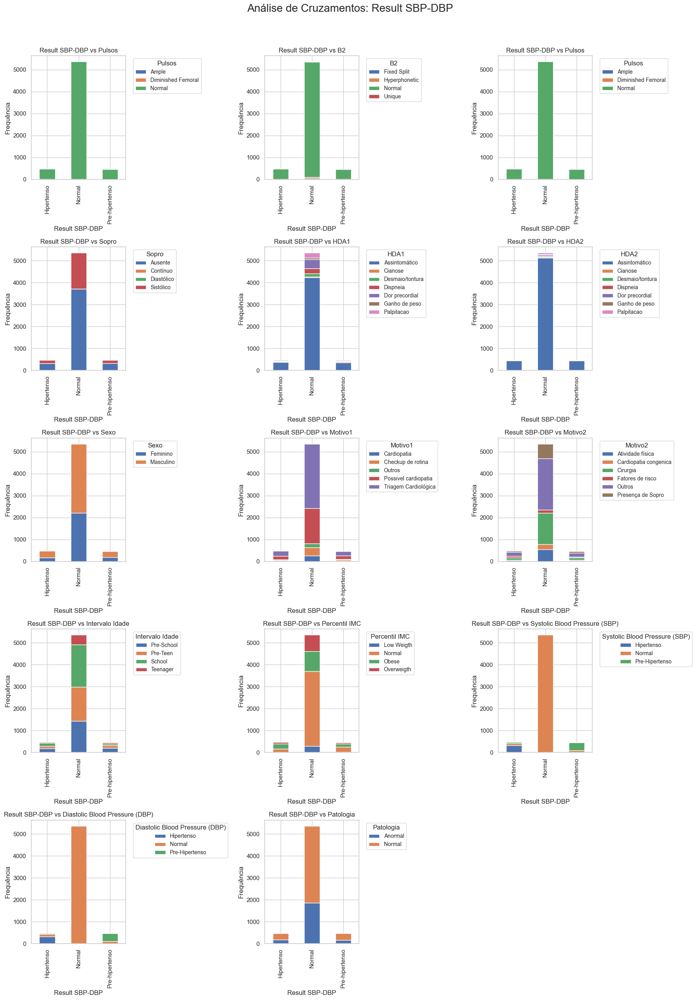

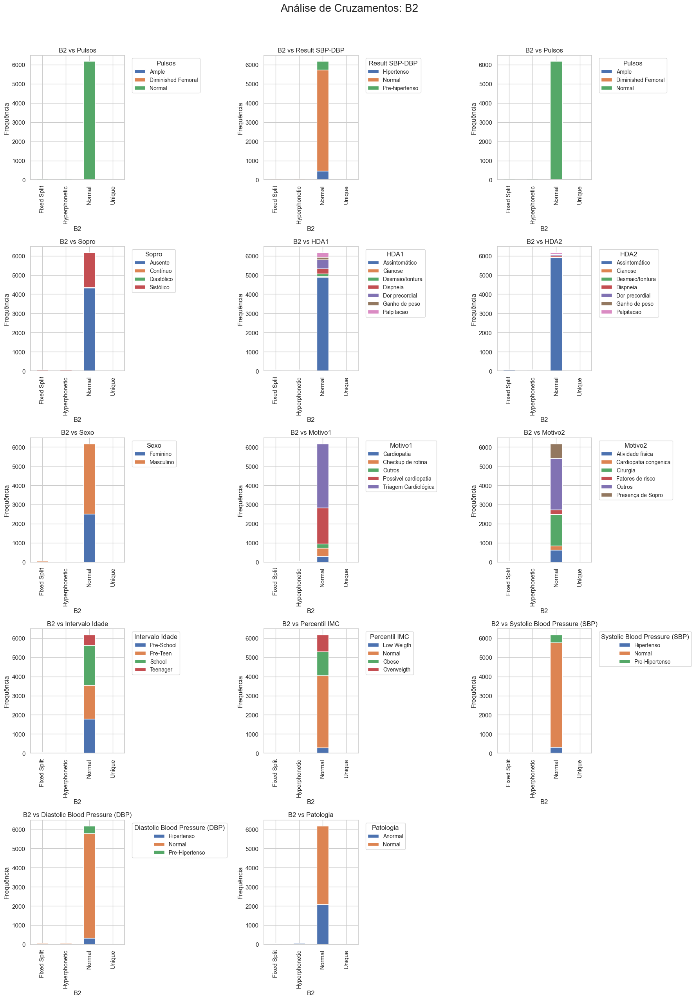

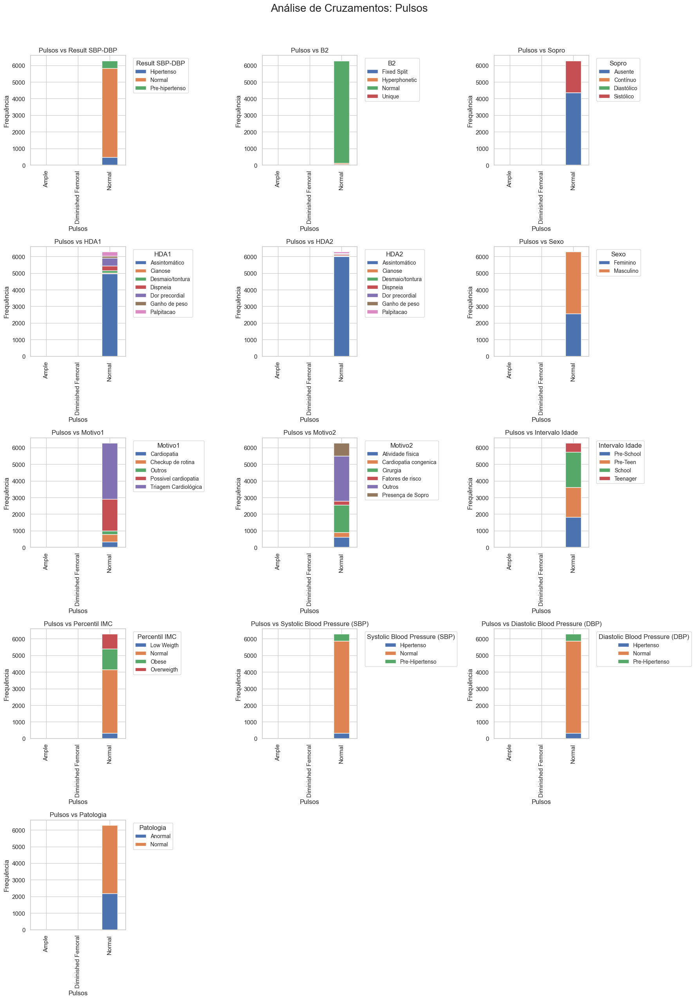

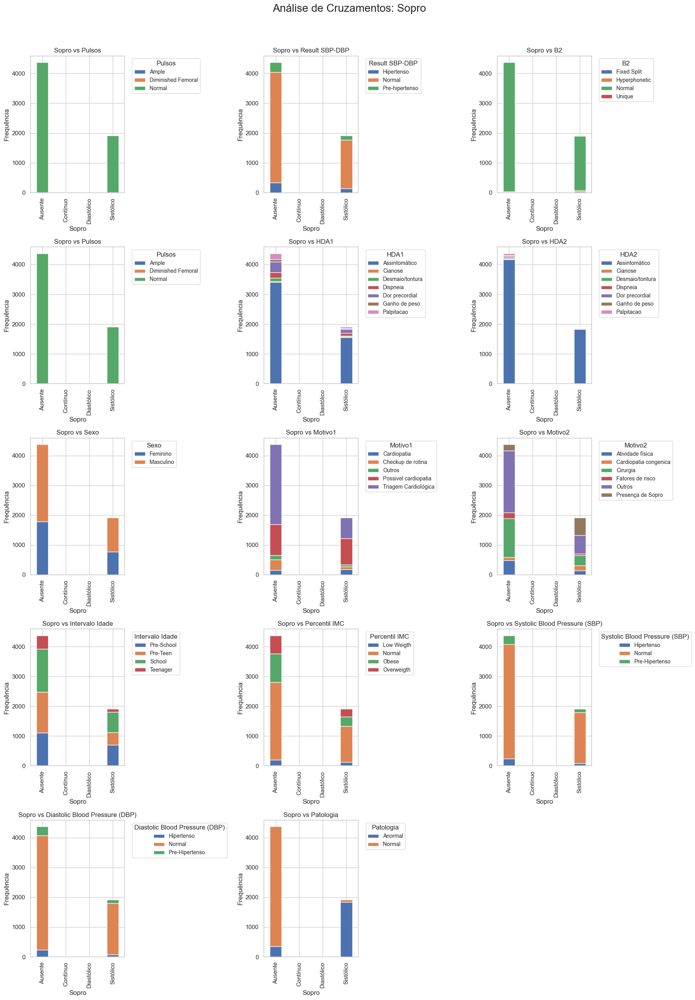

...

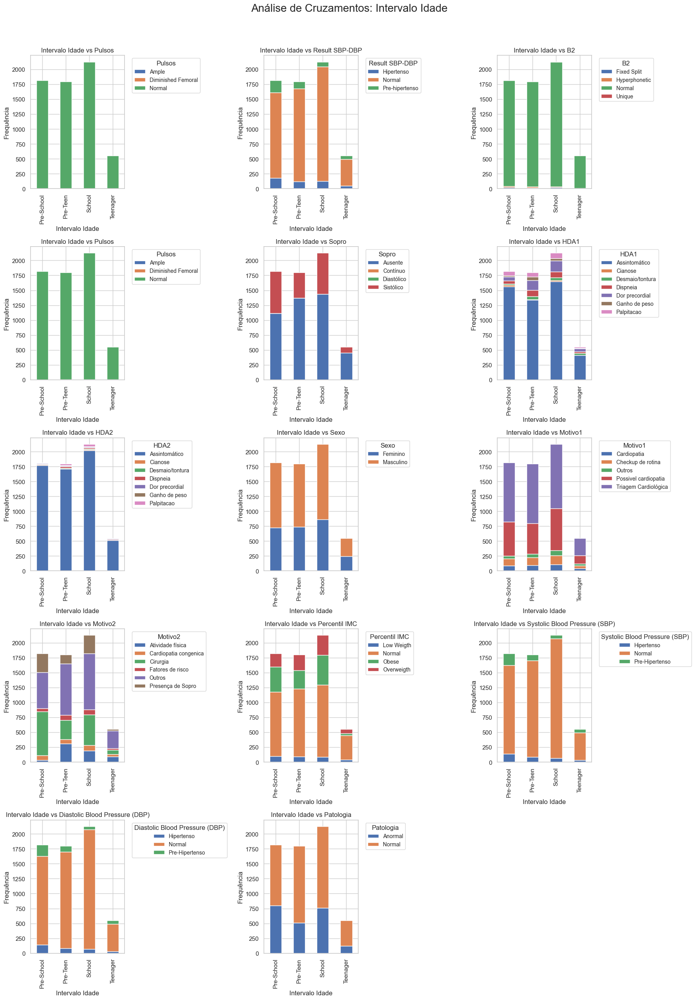

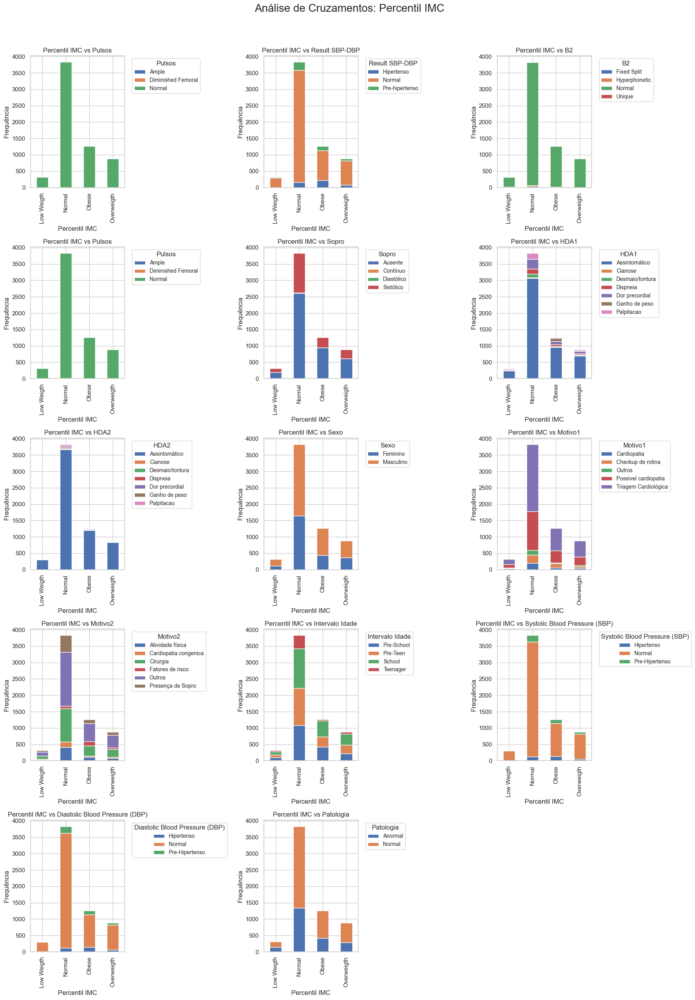

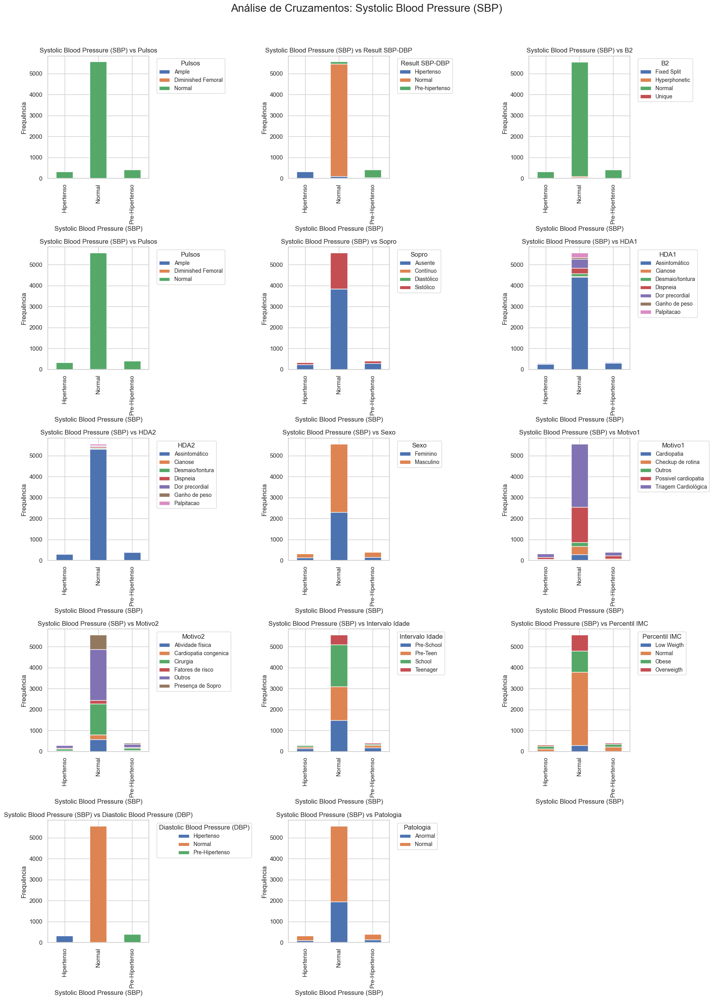

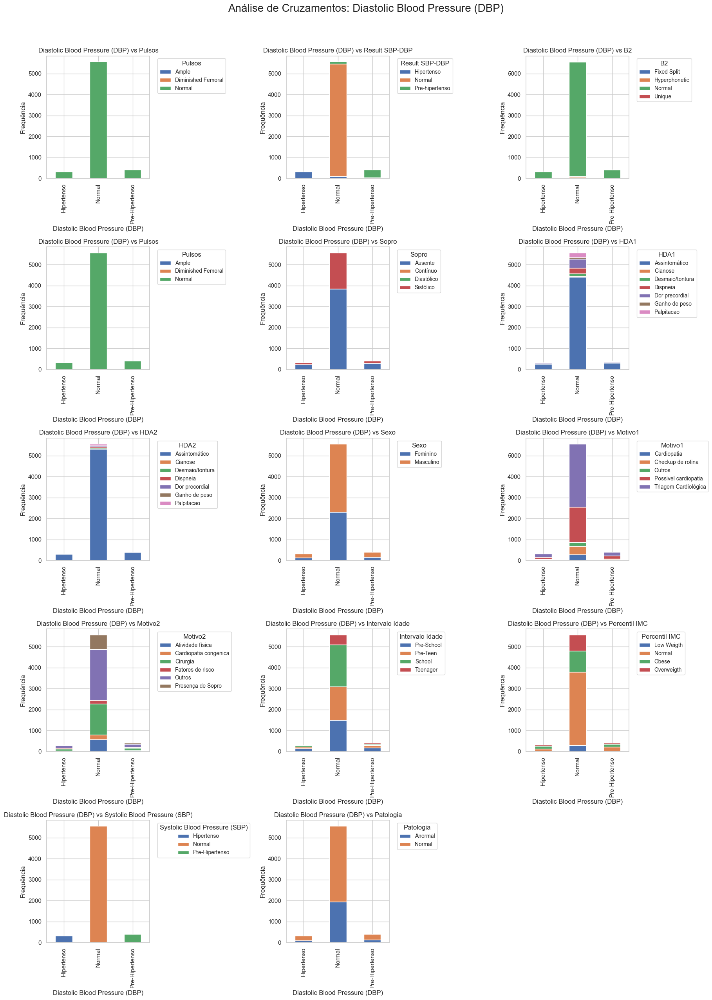

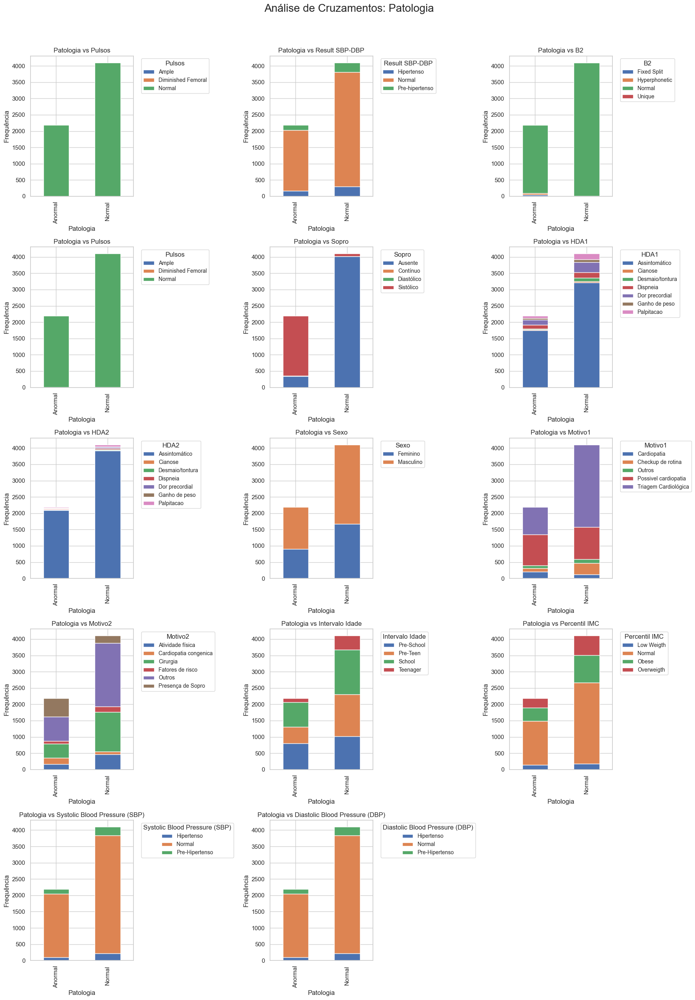

In [59]:
import math
variaveis_categoricas = [
    'Pulsos', 'Result SBP-DBP','B2', 'Pulsos', 'Sopro',
    'HDA1', 'HDA2', 'Sexo', 'Motivo1', 'Motivo2',
    'Intervalo Idade', 'Percentil IMC', 'Systolic Blood Pressure (SBP)',
    'Diastolic Blood Pressure (DBP)', 'Patologia'
]

for i in range(len(variaveis_categoricas)):
    var_focal = variaveis_categoricas[i]
    # Filtramos as outras variáveis para o eixo J
    outras_vars = [v for v in variaveis_categoricas if v != var_focal]
    
    # Configuramos a grelha (ex: 3 colunas)
    n_plots = len(outras_vars)
    n_cols = 3
    n_rows = math.ceil(n_plots / n_cols)
    
    # Criamos a figura com subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5 * n_rows))
    fig.suptitle(f'Análise de Cruzamentos: {var_focal}', fontsize=20, y=1.02)
    
    # Achatar a matriz de eixos para facilitar a iteração
    axes_flat = axes.flatten()
    
    for idx, var_j in enumerate(outras_vars):
        # Gerar a tabela de contingência
        contingencia = pd.crosstab(data[var_focal], data[var_j])
        
        # Plotar no eixo específico (stacked=True para ver proporção/composição)
        contingencia.plot(kind='bar', stacked=True, ax=axes_flat[idx])
        
        axes_flat[idx].set_title(f'{var_focal} vs {var_j}', fontsize=12)
        axes_flat[idx].set_xlabel(var_focal)
        axes_flat[idx].set_ylabel('Frequência')
        axes_flat[idx].legend(title=var_j, bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
        axes_flat[idx].tick_params(axis='x', rotation=90)

    # Remover eixos vazios (caso a grelha tenha mais espaços que variáveis)
    for j in range(idx + 1, len(axes_flat)):
        fig.delaxes(axes_flat[j])

    plt.tight_layout()
    plt.show()

## 1.5 Visualization of Linear Relationships of columns (Categorical and Numerical Variables)

For determining Linear Relationships between **Categorical and Numerical variables** we will be using ```Boxplots```

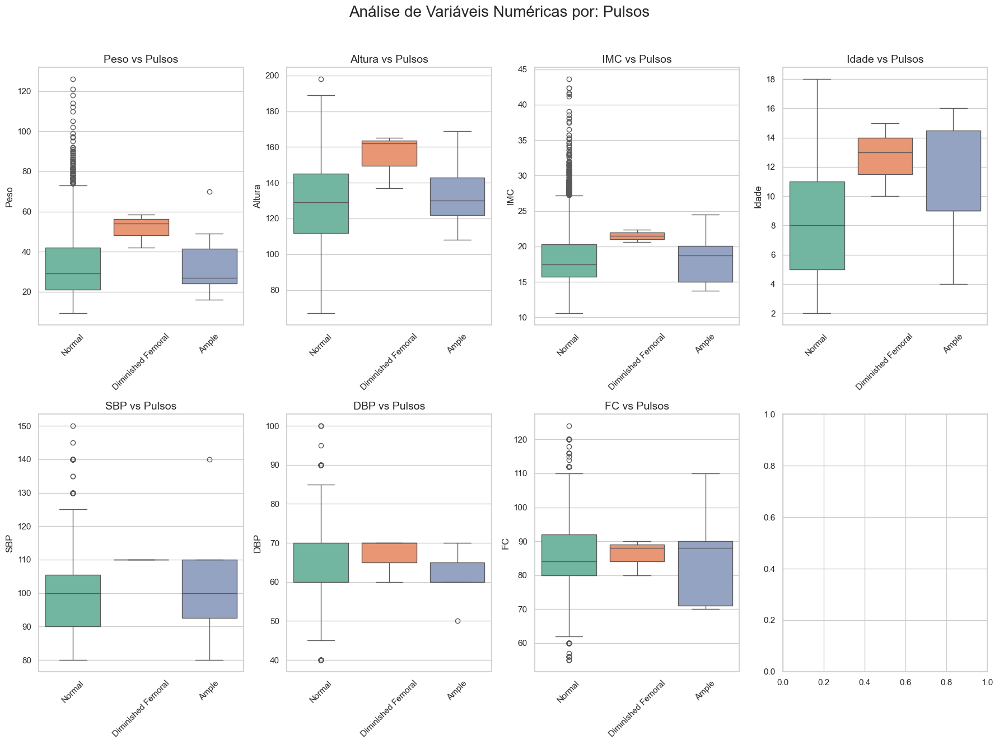

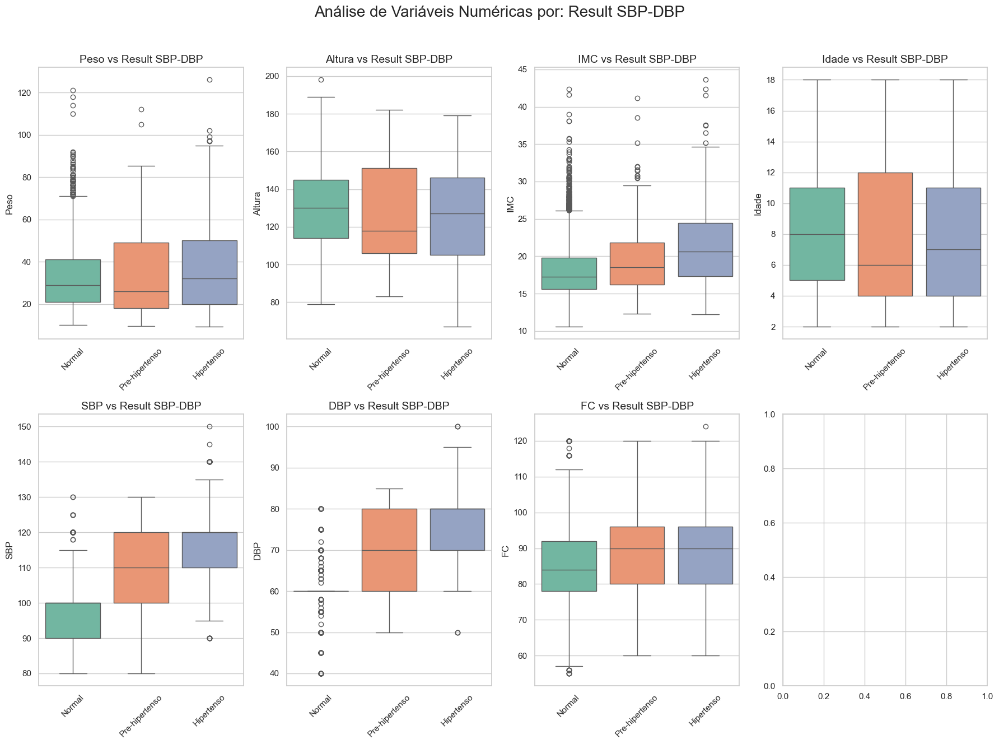

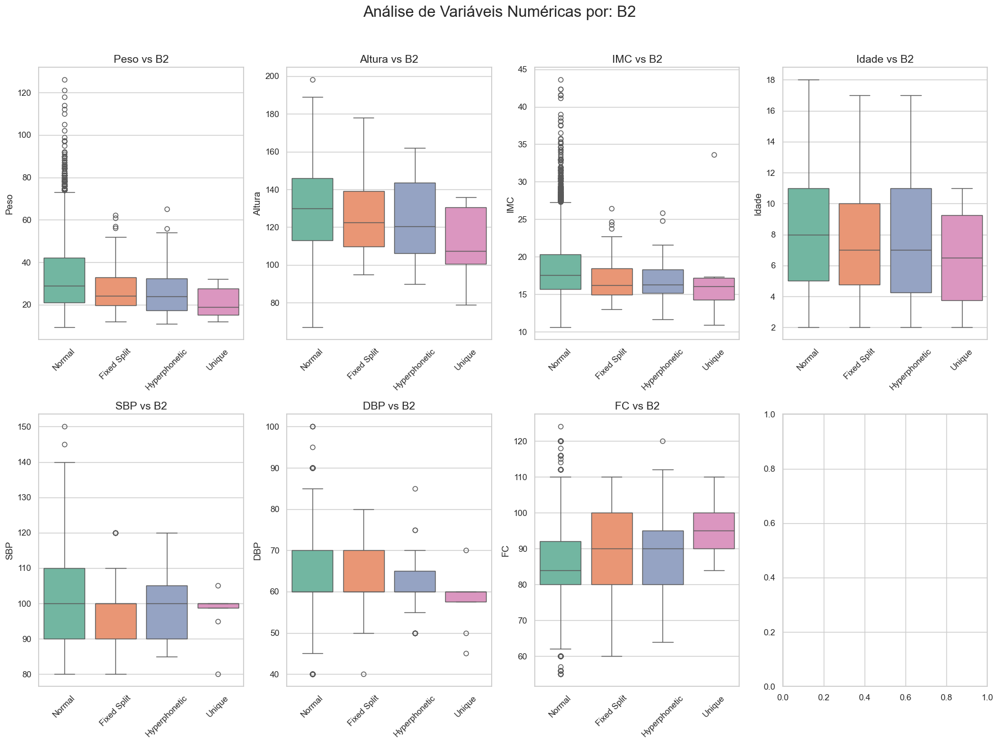

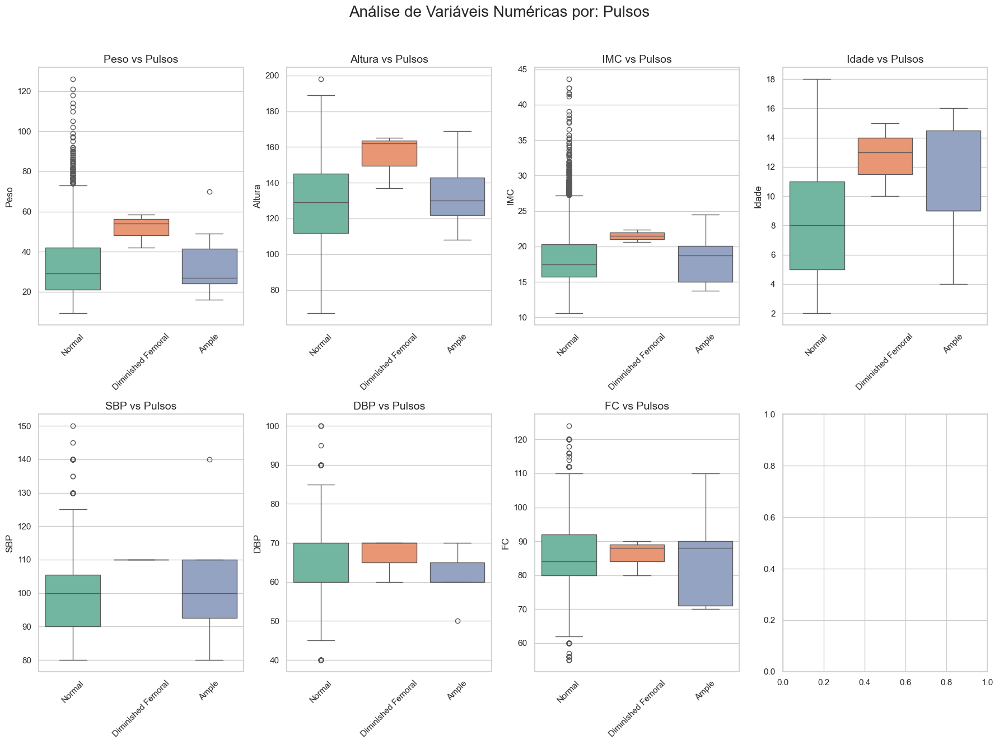

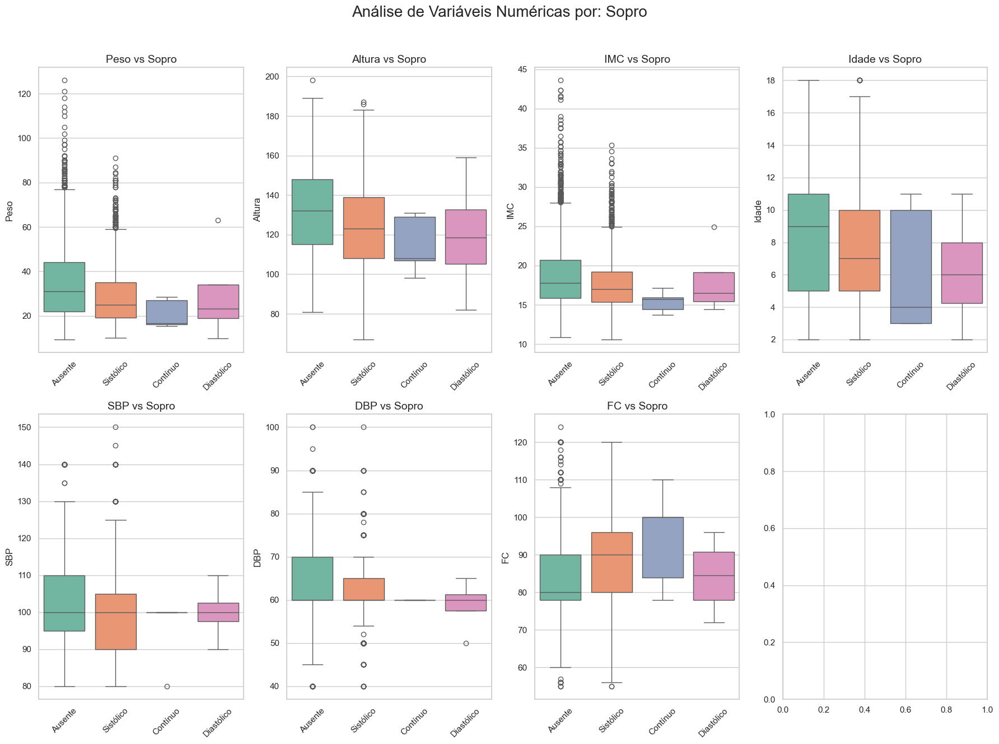

...

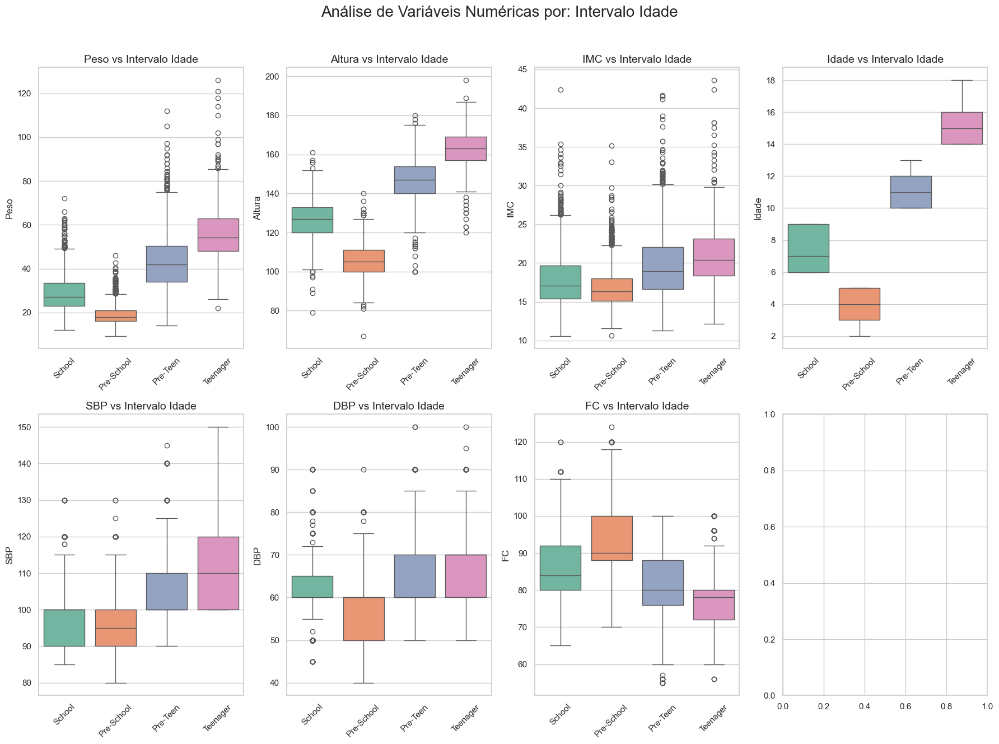

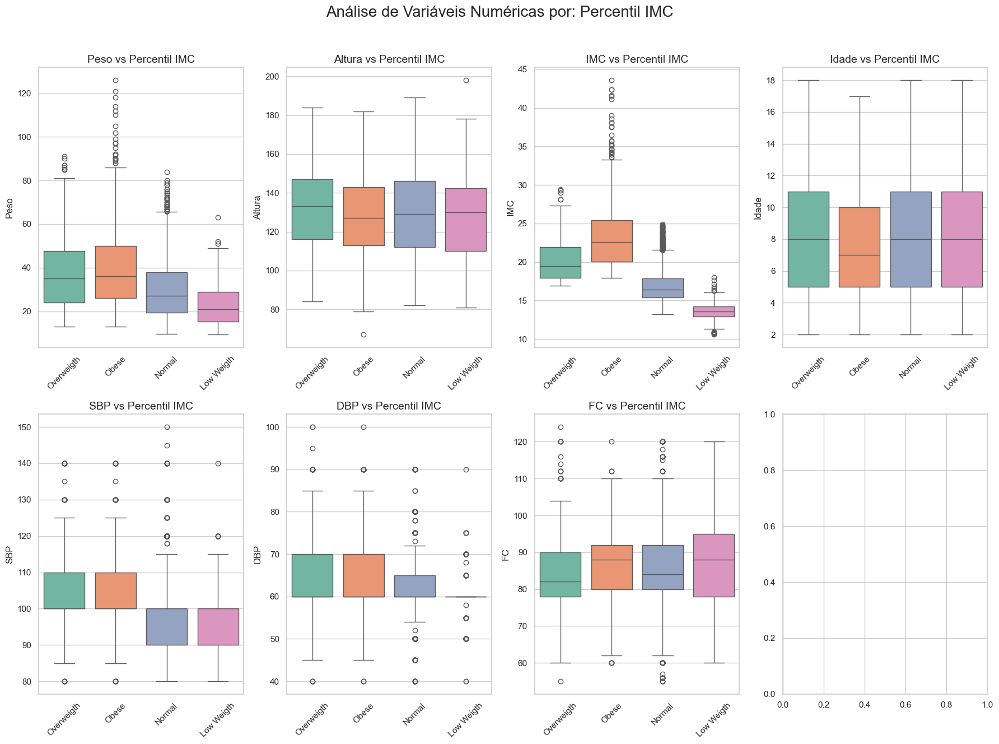

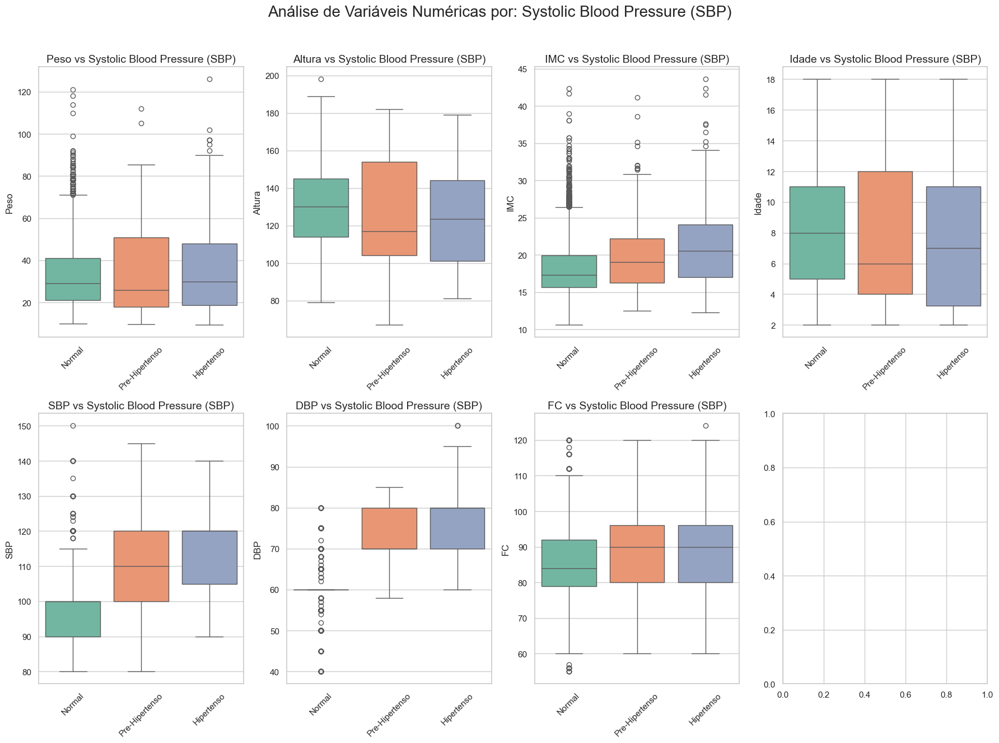

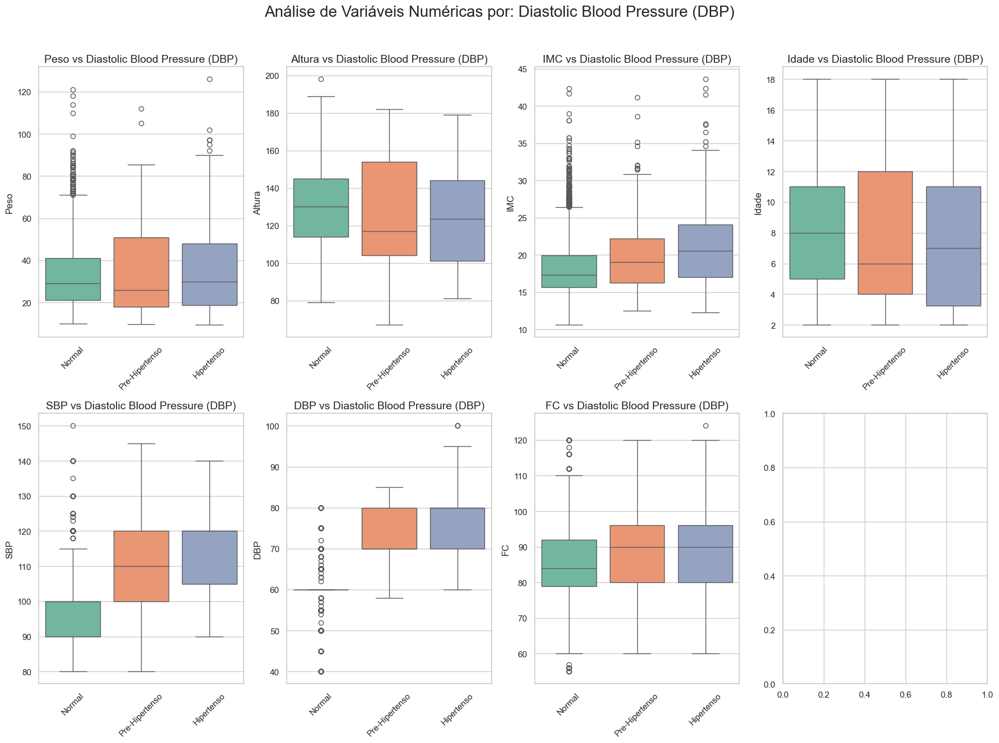

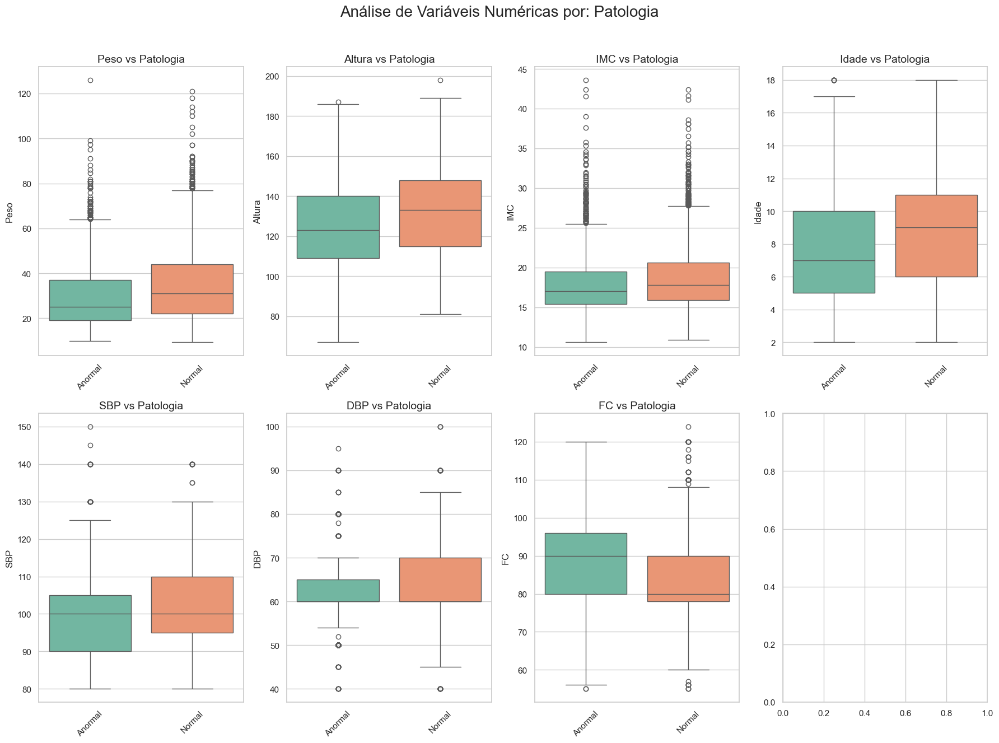

In [63]:
var_num = [
    'Peso', 'Altura', 'IMC', 'Idade', 
    'SBP', 'DBP', 'FC'
]

var_cat = [
    'Pulsos', 'Result SBP-DBP','B2', 'Pulsos', 'Sopro',
    'HDA1', 'HDA2', 'Sexo', 'Motivo1', 'Motivo2',
    'Intervalo Idade', 'Percentil IMC', 'Systolic Blood Pressure (SBP)',
    'Diastolic Blood Pressure (DBP)', 'Patologia'
]

for cat in var_cat:
    fig, axes = plt.subplots(2, 4, figsize=(18, 13))
    fig.suptitle(f'Análise de Variáveis Numéricas por: {cat}', fontsize=20, y=1.02)
    
    axes_flat = axes.flatten()
    
    # Loop por cada variável numérica para preencher a grelha
    for i, num in enumerate(var_num):
        sns.boxplot(x=cat, y=num, data=data, ax=axes_flat[i], palette='Set2')
        
        # Formatação de cada subplot
        axes_flat[i].set_title(f'{num} vs {cat}', fontsize=14)
        axes_flat[i].set_xlabel('') 
        if (cat == 'Motivo2'):
            axes_flat[i].tick_params(axis='x', rotation=90)     
        else:
            axes_flat[i].tick_params(axis='x', rotation=45)
    # Ajusta o espaçamento para evitar sobreposição de títulos e labels
    plt.tight_layout()
    plt.show()